# HALOFIT Emulator 1 - Trainer
Author: João Victor Rebouças, October 2022

Settings
- Default (L = 1024, Np1D = 1024, Nmesh1D = 2048)

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import camb
import os
from smt.sampling_methods import LHS
from scipy.integrate import simps
from scipy.interpolate import interp1d
from camb import model
from sklearn.decomposition import PCA
import emulator_funcs as emu
from emulator_funcs import params, lims, ref
from tensorflow import keras
from tensorflow.keras import layers
import sys
sys.path.append('/home/grads/data/xiao/miniconda/envs/cocoaemu/lib/python3.7/site-packages')
import euclidemu2 as ee2

In [2]:
# Matplotlib settings
axislabelfontsize='large'
matplotlib.mathtext.rcParams['legend.fontsize']='medium'
plt.rcParams["figure.figsize"] = [8.0,6.0]
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"],
    "font.size": 16,
})
axislabelfontsize='large'

## 1. Data Preprocessing
The boosts will be calculated using the following equation:

$B^{\mathrm{case}} = B^\mathrm{ref}_{EE2} \times \frac{R_{NL}}{R_{L}}$
where
$R = \frac{P^\mathrm{case}}{P^{\mathrm{ref}}}$

In [10]:
# Calculate ref cosmology from CAMB, all redshifts
ref_pk_nonlin = np.zeros((len(emu.redshifts), len(emu.ks)))
ref_pk_lin = np.zeros((len(emu.redshifts), len(emu.ks)))

ks, ref_pk_lin, ref_pk_nonlin = emu.get_pk(h=0.67, Omegab=0.049, Omegam=0.319, As10to9=2.1, ns=0.96, w=-1, redshifts=emu.redshifts)
ref_boost = ref_pk_nonlin/ref_pk_lin

Note: redshifts have been re-sorted (earliest first)


In [5]:
# Load cosmologies in LHS
num_of_points = 400
sample = np.genfromtxt('./Data/lhs.txt')

In [6]:
# Adjusting to my previous convention of using 10**9 As
sample[:,3] = sample[:,3] * 10**9

In [11]:
# Loading CAMB power spectra and defining boosts
pks_lin = np.zeros((num_of_points, len(emu.redshifts), 1200)) # Shape is (num_simulations, num_redshifts, num_ks)
pks_nonlin = np.zeros((num_of_points, len(emu.redshifts), 1200))
log_boosts = np.zeros((num_of_points, len(emu.redshifts), 1200))

for i in range(num_of_points):
    print(i)
    ks, pks_lin[i,:,:], pks_nonlin[i,:,:] = emu.get_pk(h=sample[i,4], Omegab=sample[i,1], Omegam=sample[i,0], As10to9=sample[i,3], ns=sample[i,2], w=-1, redshifts=emu.redshifts)
    for j in range(len(emu.redshifts)):    
        r_nl = pks_nonlin[i,j,:]/ref_pk_nonlin[j,:]
        r_l = pks_lin[i,j,:]/ref_pk_lin[j]
        log_boosts[i,j,:] = np.log(ref_boost[j] * r_nl / r_l)

0
Note: redshifts have been re-sorted (earliest first)
1
Note: redshifts have been re-sorted (earliest first)
2
Note: redshifts have been re-sorted (earliest first)
3
Note: redshifts have been re-sorted (earliest first)
4
Note: redshifts have been re-sorted (earliest first)
5
Note: redshifts have been re-sorted (earliest first)
6
Note: redshifts have been re-sorted (earliest first)
7
Note: redshifts have been re-sorted (earliest first)
8
Note: redshifts have been re-sorted (earliest first)
9
Note: redshifts have been re-sorted (earliest first)
10
Note: redshifts have been re-sorted (earliest first)
11
Note: redshifts have been re-sorted (earliest first)
12
Note: redshifts have been re-sorted (earliest first)
13
Note: redshifts have been re-sorted (earliest first)
14
Note: redshifts have been re-sorted (earliest first)
15
Note: redshifts have been re-sorted (earliest first)
16
Note: redshifts have been re-sorted (earliest first)
17
Note: redshifts have been re-sorted (earliest first)
18

146
Note: redshifts have been re-sorted (earliest first)
147
Note: redshifts have been re-sorted (earliest first)
148
Note: redshifts have been re-sorted (earliest first)
149
Note: redshifts have been re-sorted (earliest first)
150
Note: redshifts have been re-sorted (earliest first)
151
Note: redshifts have been re-sorted (earliest first)
152
Note: redshifts have been re-sorted (earliest first)
153
Note: redshifts have been re-sorted (earliest first)
154
Note: redshifts have been re-sorted (earliest first)
155
Note: redshifts have been re-sorted (earliest first)
156
Note: redshifts have been re-sorted (earliest first)
157
Note: redshifts have been re-sorted (earliest first)
158
Note: redshifts have been re-sorted (earliest first)
159
Note: redshifts have been re-sorted (earliest first)
160
Note: redshifts have been re-sorted (earliest first)
161
Note: redshifts have been re-sorted (earliest first)
162
Note: redshifts have been re-sorted (earliest first)
163
Note: redshifts have been r

290
Note: redshifts have been re-sorted (earliest first)
291
Note: redshifts have been re-sorted (earliest first)
292
Note: redshifts have been re-sorted (earliest first)
293
Note: redshifts have been re-sorted (earliest first)
294
Note: redshifts have been re-sorted (earliest first)
295
Note: redshifts have been re-sorted (earliest first)
296
Note: redshifts have been re-sorted (earliest first)
297
Note: redshifts have been re-sorted (earliest first)
298
Note: redshifts have been re-sorted (earliest first)
299
Note: redshifts have been re-sorted (earliest first)
300
Note: redshifts have been re-sorted (earliest first)
301
Note: redshifts have been re-sorted (earliest first)
302
Note: redshifts have been re-sorted (earliest first)
303
Note: redshifts have been re-sorted (earliest first)
304
Note: redshifts have been re-sorted (earliest first)
305
Note: redshifts have been re-sorted (earliest first)
306
Note: redshifts have been re-sorted (earliest first)
307
Note: redshifts have been r

In [13]:
# Saving boosts in Data/
for i, q in enumerate(log_boosts):
    np.savetxt(f'./Data/LogBoosts/logboosts_{i}.txt', q, header='Redshift    K')

In [7]:
# Loading boosts from Data/
log_boosts = np.zeros((num_of_points, len(emu.redshifts), 1200))
for i in range(num_of_points):
    log_boosts[i] = np.loadtxt(f'./Data/LogBoosts/logboosts_{i}.txt')

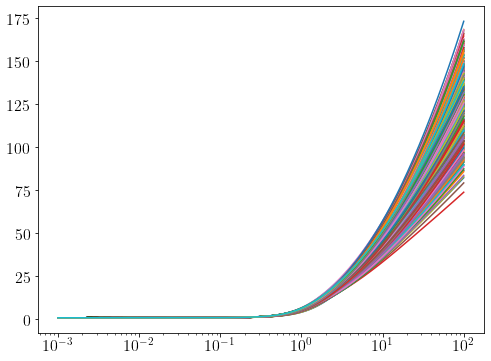

In [12]:
for i in range(len(sample)):
    plt.semilogx(ks_ee2, np.exp(log_boosts[i,0]))

In [14]:
ks_ee2

array([1.00000000e-03, 1.00964835e-03, 1.01938980e-03, ...,
       9.80979013e+01, 9.90443847e+01, 1.00000000e+02])

In [15]:
# Normalized parameters - input for NN
norm_sample = np.zeros((num_of_points,5))
for i, point in enumerate(sample):
    norm_params = emu.normalize_params(point)
    norm_sample[i] = norm_params

In [20]:
# Normalized Boosts with Min-Max
norm_log_boosts = np.zeros((num_of_points, len(emu.redshifts), 1200))
for i in range(len(emu.redshifts)):
    norm_log_boosts[:,i,:] = emu.normalize_array(log_boosts[:,i,:]) # I normalize within each redshift

In [19]:
# Getting and saving min and max for rescaling
mins = np.zeros(len(emu.redshifts))
maxs = np.zeros(len(emu.redshifts))
for i in range(len(emu.redshifts)):
    mins[i] = np.amin(log_boosts[:,i,:])
    maxs[i] = np.amax(log_boosts[:,i,:])
np.savetxt('./Data/mins_maxs.txt', np.dstack((mins, maxs))[0])

In [38]:
mins, maxs = np.loadtxt('mins_maxs.txt', unpack=True)

In [15]:
num_pcs = 6
pca = PCA(n_components=num_pcs)
reduced_norm_qs_thisz = pca.fit_transform(norm_qs[:,0,:])
reconstructed_norm_qs_thisz = pca.inverse_transform(reduced_norm_qs_thisz)

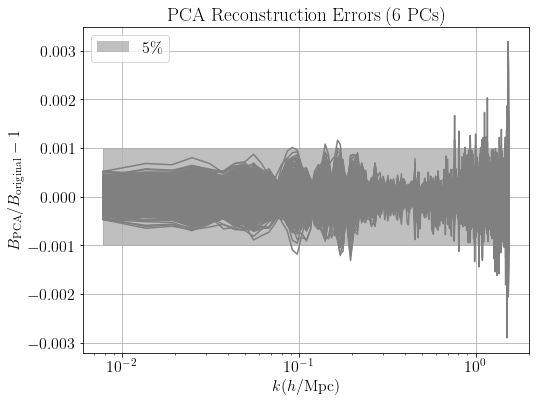

In [43]:
for i in range(len(sample)):
    plt.semilogx(emu.ks, np.exp(reconstructed_norm_qs_thisz[i,:])/np.exp(norm_qs[i,0,:]) - 1, color='gray')
plt.fill_between(emu.ks, -0.001, 0.001, color='gray', alpha=0.5)
plt.title('PCA Reconstruction Errors (6 PCs)')
plt.xlabel(r'$k (h/\mathrm{Mpc})$')
plt.ylabel(r'$B_\mathrm{PCA}/B_\mathrm{original} - 1$')
# Legend
from matplotlib.patches import Patch
gray_patch = Patch(facecolor='gray', alpha=0.5, label=r'$5\%$')
plt.grid()
plt.legend(handles=[gray_patch])

In [22]:
# PCA reduction
num_pcs = 6
pcas, reduced_norm_log_boosts = emu.pca_reduction(num_pcs, norm_log_boosts, log_boosts)

In [28]:
reconstructed_norm_log_boosts = np.zeros((400, 49, 1200))
reconstructed_norm_log_boosts2 = np.zeros((400, 49, 1200))
for i in range(len(emu.redshifts)):
    avg = pcas[i].mean_
    eigenvectors = pcas[i].components_
    reconstructed_norm_log_boosts[:,i,:] = avg
    np.savetxt('./Data/Averages/average_{:.2f}.txt'.format(emu.redshifts[i]), avg)
    np.savetxt('./Data/PC_Basis/components_{:.2f}.txt'.format(emu.redshifts[i]), eigenvectors)
    for point in range(len(sample)):
        for j in range(num_pcs):
            reconstructed_norm_log_boosts[point,i,:] += reduced_norm_log_boosts[point,i,j] * eigenvectors[j]
    reconstructed_norm_log_boosts2[:,i,:] = pcas[i].inverse_transform(reduced_norm_log_boosts[:,i,:])

In [29]:
np.allclose(reconstructed_norm_log_boosts, reconstructed_norm_log_boosts2)

True

In [31]:
mins_pcs = np.zeros(len(emu.redshifts))
maxs_pcs = np.zeros(len(emu.redshifts))
for i in range(len(emu.redshifts)):
    mins_pcs[i] = np.amin(reduced_norm_log_boosts[:,i,:])
    maxs_pcs[i] = np.amax(reduced_norm_log_boosts[:,i,:])
np.savetxt('./Data/mins_maxs_pcs.txt', np.dstack((mins_pcs, maxs_pcs))[0])

## 2. Neural Network Architecture and Training
Training strategy:
 - First, train the chosen architecture for many epochs (I chose 30k) with train-validation splitting. Plot the train and validation losses as a function of the number of epochs. Choose an optimal number of training epochs.
 - When the model is initialized, train for a few (300) epochs. I noticed that sometimes the model gets stuck at losses around 7% or even 15%. Such local minima are hard to get out from. The "best" minimum is under 1% errors, and we want to converge to that. This way, in this initial training, I check if the model is stuck at a bad minimum. If so, I initialize the model again. Most of the times, the model quickly finds the best minimum.
 - After this, train for the number of epochs determined in step 1.

In [32]:
input_data = norm_sample # Normalized Cosmological Parameters

In [33]:
def nn_model_train(pc_components, input_data):
    '''
    Creates and trains a neural network model that emulates the pc_components from the input_data
    Returns
    '''
    norm_pcs = emu.normalize_array(pc_components)
    ground_truths = norm_pcs
    emulator_model = emu.generate_model(num_pcs, 2, input_data, num_of_neurons=1024)
    
    emulator_model.compile(
        optimizer = keras.optimizers.Adam(),
        loss = keras.losses.MeanAbsoluteError()
        # metrics = [keras.metrics.Precision()]
    )
    # Dividing into train/validation
    history = emulator_model.fit(
                            input_data,
                            ground_truths,
                            batch_size = 30,
                            epochs = 300,
                            #validation_data = (input_data[360:], ground_truths[360:])
                            )
    last_loss = history.history['loss'][-1]
    return emulator_model, last_loss

In [34]:
# Training loop for all redshifts
# assert False, "Make sure you really want to run this"
for i in range(49): # One NN for each redshift
    j = 0 # Starting from redshifts[j]
    
    emulator_model, last_loss = nn_model_train(reduced_norm_log_boosts[:,j+i,:], input_data)
    while last_loss > 0.01:
        print('Stuck on a bad local minimum. Retraining:')
        emulator_model, last_loss = nn_model_train(reduced_norm_log_boosts[:,j+i,:], input_data)
    # If unstuck, train for longer
    norm_pcs = emu.normalize_array(reduced_norm_log_boosts[:,j+i,:])
    ground_truths = norm_pcs
    history = emulator_model.fit(
                            input_data,
                            ground_truths,
                            batch_size = 30,
                            epochs = 2000,
                            #validation_data = (input_data[360:], ground_truths[360:])
                            )
    emulator_model.save(f'./NN_MODELS/HALOFIT_EMU_1_NHID=2_NEURONS=1024_z={emu.redshifts[j+i]:.3f}')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________


2023-01-30 11:52:43.280783: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusolver.so.11'; dlerror: libcusolver.so.11: cannot open shared object file: No such file or directory
2023-01-30 11:52:43.294005: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1850] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2023-01-30 11:52:43.294962: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1906
Epoch 2/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1304
Epoch 3/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1161
Epoch 4/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0966
Epoch 5/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0504
Epoch 6/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0302
Epoch 7/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 8/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0160
Epoch 9/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 10/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0098
Epoch 11/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 12/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0098
Epoch 13/300
14/14 [=================

14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 203/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 204/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 205/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 206/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 207/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 208/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0055
Epoch 209/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 210/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 211/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0044
Epoch 212/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 213/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 214/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 3/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 4/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0038
Epoch 5/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0049
Epoch 6/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 7/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 8/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 9/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 10/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 11/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 12/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 13/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 14/2000
14/14 [================

14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 103/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 104/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 105/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 106/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 107/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 108/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 109/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 110/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 111/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 112/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 113/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 114/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 299/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 300/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 301/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 302/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 303/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 304/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 305/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 306/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 307/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 308/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 309/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 310/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 495/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 496/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 497/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 498/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 499/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 500/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 501/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 502/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 503/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 504/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 505/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 506/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 691/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 692/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 693/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 694/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 695/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 696/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 697/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 698/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 699/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 700/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 701/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 702/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 887/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 888/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 889/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 890/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 891/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 892/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 893/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 894/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 895/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 896/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 897/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 898/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1082/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1083/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1084/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1085/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1086/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1087/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1088/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1089/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1090/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1091/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1092/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 10

14/14 [==============================] - 0s 4ms/step - loss: 9.8488e-04
Epoch 1276/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1277/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1278/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1279/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1280/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1281/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1282/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1283/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1284/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1285/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1286/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1470/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1471/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1472/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1473/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1474/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1475/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1476/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1477/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1478/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.9611e-04
Epoch 1479/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1480/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1664/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1665/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1666/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1667/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1668/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1669/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1670/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1671/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1672/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1673/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1674/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 16

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1858/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1859/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1860/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1861/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1862/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1863/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1864/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1865/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1866/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1867/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1868/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 18

2023-01-30 11:54:42.899455: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ./NN_MODELS/HALOFIT_EMU_1_NHID=2_NEURONS=1024_z=0.000/assets
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.2382
Epoch 2/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1806
Epoch 3/300
14/14 [==============================] -

14/14 [==============================] - 0s 3ms/step - loss: 0.0750
Epoch 191/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0742
Epoch 192/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0740
Epoch 193/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0742
Epoch 194/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0744
Epoch 195/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0751
Epoch 196/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0745
Epoch 197/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0744
Epoch 198/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0749
Epoch 199/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0742
Epoch 200/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0738
Epoch 201/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0739
Epoch 202/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0738
Epoch 291/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0746
Epoch 292/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0739
Epoch 293/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0741
Epoch 294/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0744
Epoch 295/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0738
Epoch 296/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0745
Epoch 297/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0744
Epoch 298/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0751
Epoch 299/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0742
Epoch 300/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0740
Stuck on a bad local minimum. Retraining:
Model: "sequential_2"
________________________________________________

14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 181/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 182/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0049
Epoch 183/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 184/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 185/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 186/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 187/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 188/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 189/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 190/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 191/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 192/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 281/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 282/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 283/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 284/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 285/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 286/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 287/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 288/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 289/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 290/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 291/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 292/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 180/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 181/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 182/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 183/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 184/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 185/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 186/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 187/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 188/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 189/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 190/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 191/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 376/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 377/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 378/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 379/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 380/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 381/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 382/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 383/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 384/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 385/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 386/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 387/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 572/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 573/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 574/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 575/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 576/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 577/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 578/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 579/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 580/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 581/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 582/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 583/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 768/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 769/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 770/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 771/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 772/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 773/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 774/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 775/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 776/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 777/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 778/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 779/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 964/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 965/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 966/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 967/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 968/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 969/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 970/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 971/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 972/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 973/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 974/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 975/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1062/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1063/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1064/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1065/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1066/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1067/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1068/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1069/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1070/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1071/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1072/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 10

14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1256/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1257/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1258/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1259/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1260/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1261/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1262/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1263/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1264/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1265/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1266/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 12

14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1450/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1451/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1452/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1453/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1454/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1455/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1456/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1457/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1458/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1459/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1460/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 14

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1644/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1645/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1646/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1647/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.9942e-04
Epoch 1648/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1649/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1650/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1651/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.9435e-04
Epoch 1652/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1653/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1654/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012


14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1838/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1839/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1840/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1841/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1842/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1843/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1844/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1845/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1846/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1847/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1848/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 18

14/14 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 22/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 23/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0063
Epoch 24/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 25/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0078
Epoch 26/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 27/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 28/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0062
Epoch 29/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0051
Epoch 30/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 31/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 32/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 33/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 123/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 124/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 125/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 126/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 127/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 128/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 129/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 130/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 131/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 132/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 133/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 134/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 223/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 224/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 225/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 226/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 227/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 228/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 229/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 230/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 231/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 232/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 233/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 234/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 122/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 123/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 124/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 125/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 126/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 127/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 128/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 129/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 130/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 131/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 132/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 133/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 318/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 319/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 320/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 321/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 322/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 323/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 324/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 325/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 326/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 327/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 328/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 329/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 514/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 515/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 516/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 517/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 518/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 519/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 520/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 521/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 522/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 523/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 524/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 525/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 710/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 711/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 712/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 713/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 714/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 715/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 716/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 717/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 718/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 719/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 720/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 721/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 906/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 907/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 908/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 909/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 910/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 911/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 912/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 913/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 914/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 915/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 916/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 917/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1101/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1102/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1103/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1104/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1105/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 1106/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1107/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1108/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1109/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1110/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1111/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 11

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1295/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1296/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1297/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1298/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1299/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1300/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1301/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1302/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 1303/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1304/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1305/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 13

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1489/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1490/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1491/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1492/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1493/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1494/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1495/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1496/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1497/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1498/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1499/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 15

14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1683/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1684/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1685/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1686/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1687/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1688/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1689/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.5765e-04
Epoch 1690/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1691/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1692/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1693/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1877/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1878/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1879/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1880/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1881/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1882/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1883/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1884/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1885/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1886/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1887/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 18

14/14 [==============================] - 0s 4ms/step - loss: 0.0049
Epoch 62/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 63/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0048
Epoch 64/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 65/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 66/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0048
Epoch 67/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 68/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 69/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 70/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0082
Epoch 71/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 72/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 73/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 262/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 263/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 264/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 265/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 266/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0048
Epoch 267/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 268/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 269/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 270/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 271/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 272/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 273/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 161/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 162/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 163/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 164/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 165/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 166/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 167/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 168/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 169/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 170/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 171/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 172/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 357/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 358/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 359/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 360/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 361/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 362/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 363/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 364/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 365/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 366/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 367/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 368/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 553/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 554/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 555/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 556/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 557/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 558/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 559/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 560/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 561/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 562/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 563/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 564/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 749/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 750/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 751/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 752/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 753/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 754/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 755/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 756/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 757/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 758/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 759/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 760/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 945/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 946/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 947/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 948/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 949/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 950/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 951/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 952/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 953/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 954/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 955/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 956/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1140/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1141/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1142/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1143/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1144/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1145/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1146/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1147/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 1148/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1149/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1150/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 11

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1334/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1335/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1336/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1337/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1338/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1339/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1340/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1341/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1342/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1343/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1344/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 13

14/14 [==============================] - 0s 11ms/step - loss: 0.0012
Epoch 1528/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1529/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1530/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1531/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1532/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1533/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1534/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1535/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1536/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1537/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1538/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1

14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1722/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1723/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1724/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1725/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1726/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1727/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1728/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1729/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1730/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1731/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1732/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 17

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1916/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1917/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1918/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1919/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1920/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1921/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1922/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1923/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1924/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1925/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1926/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 19

14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 103/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 104/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 105/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0066
Epoch 106/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 107/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 108/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 109/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 110/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 111/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 112/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 113/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 114/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 203/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 204/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 205/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 206/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 207/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 208/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 209/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 210/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 211/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 212/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0048
Epoch 213/300
14/14 [==============================] - 0s 2ms/step - loss: 0.0035
Epoch 214/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 3/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 4/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 5/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 6/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 7/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 8/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 9/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 10/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 11/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 12/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 13/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 14/2000
14/14 [================

14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 103/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 104/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 105/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 106/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 107/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 108/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 109/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 110/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 111/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 112/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 113/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 114/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 299/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 300/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 301/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 302/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 303/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 304/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 305/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 306/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 307/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 308/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 309/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 310/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 495/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 496/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 497/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 498/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 499/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 500/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 501/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 502/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 503/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 504/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 505/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 506/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 691/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 692/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 693/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 694/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 695/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 696/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 697/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 698/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 699/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 700/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 701/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 702/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 887/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 888/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 889/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 890/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 891/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 892/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 893/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 894/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 895/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 896/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 897/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 898/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 1082/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1083/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1084/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1085/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1086/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1087/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1088/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1089/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1090/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1091/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1092/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 10

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1276/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1277/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1278/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1279/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1280/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1281/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1282/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1283/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1284/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1285/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1286/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 12

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1470/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1471/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1472/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1473/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1474/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1475/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1476/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1477/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1478/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1479/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.8628e-04
Epoch 1480/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.6439e-04


14/14 [==============================] - 0s 3ms/step - loss: 8.4136e-04
Epoch 1664/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1665/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1666/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1667/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1668/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1669/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1670/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1671/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1672/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1673/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1674/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1858/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1859/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1860/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.7166e-04
Epoch 1861/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1862/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1863/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1864/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1865/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1866/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1867/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.2056e-04
Epoch 1868/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013


14/14 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 43/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 44/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 45/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 46/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 47/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 48/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 49/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 50/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0069
Epoch 51/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 52/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 53/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0063
Epoch 54/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 243/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 244/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 245/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 246/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 247/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 248/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 249/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 250/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 251/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0048
Epoch 252/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 253/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 254/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 142/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 143/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 144/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 145/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 146/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 147/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 148/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 149/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 150/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 151/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 152/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 153/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 338/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 339/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 340/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 341/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 342/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 343/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 344/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 345/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 346/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 347/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 348/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 349/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 534/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 535/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 536/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 537/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 538/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 539/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 540/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 541/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 542/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 543/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 544/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 545/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 730/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 731/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 732/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 733/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 734/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 735/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 736/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 737/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 738/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 739/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 740/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 741/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 926/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 927/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 928/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 929/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 930/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 931/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 932/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 933/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 934/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 935/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 936/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 937/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1121/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1122/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1123/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 1124/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 1125/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1126/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1127/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1128/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0015
Epoch 1129/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1130/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1131/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 11

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1315/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1316/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1317/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1318/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1319/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1320/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1321/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1322/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1323/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1324/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1325/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 13

14/14 [==============================] - 0s 3ms/step - loss: 9.8082e-04
Epoch 1509/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1510/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1511/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1512/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.9975e-04
Epoch 1513/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1514/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1515/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1516/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1517/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1518/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1519/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014


14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1703/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1704/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1705/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1706/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1707/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1708/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1709/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1710/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1711/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1712/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1713/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 17

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1897/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1898/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1899/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1900/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1901/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1902/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1903/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.9407e-04
Epoch 1904/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1905/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1906/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1907/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0044
Epoch 83/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 84/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 85/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 86/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 87/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0071
Epoch 88/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 89/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 90/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 91/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 92/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0075
Epoch 93/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 94/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 283/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 284/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 285/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 286/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 287/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 288/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 289/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 290/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 291/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 292/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 293/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 294/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 182/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 183/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 184/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 185/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 186/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 187/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 188/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 189/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 190/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 191/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 192/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 193/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 378/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 379/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 380/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 381/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 382/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 383/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 384/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 385/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 386/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 387/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 388/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 389/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 574/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 575/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 576/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 577/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 578/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 579/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 580/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 581/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 582/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 583/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 584/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 585/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 770/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 771/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 772/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 773/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 774/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 775/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 776/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 777/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 778/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 779/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 780/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 781/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 966/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 967/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 968/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 969/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 970/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 971/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 972/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 973/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 974/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 975/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 976/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 977/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1064/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1065/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1066/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1067/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1068/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1069/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1070/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1071/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1072/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1073/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1074/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 10

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1258/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1259/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1260/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1261/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1262/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1263/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1264/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1265/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1266/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1267/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1268/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 12

14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1452/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1453/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1454/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1455/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1456/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1457/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5732e-04
Epoch 1458/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1459/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1460/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1461/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1462/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1646/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1647/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1648/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1649/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1650/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1651/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1652/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1653/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1654/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1655/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1656/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 16

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1840/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1841/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1842/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1843/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1844/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1845/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1846/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1847/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1848/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1849/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1850/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 18

14/14 [==============================] - 0s 3ms/step - loss: 0.0807
Epoch 24/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0792
Epoch 25/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0778
Epoch 26/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0757
Epoch 27/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0775
Epoch 28/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0772
Epoch 29/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0770
Epoch 30/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0763
Epoch 31/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0761
Epoch 32/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0760
Epoch 33/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0782
Epoch 34/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0780
Epoch 35/300
14/14 [=====================

14/14 [==============================] - 0s 4ms/step - loss: 0.0749
Epoch 125/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0754
Epoch 126/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0751
Epoch 127/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0753
Epoch 128/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0757
Epoch 129/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0756
Epoch 130/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0764
Epoch 131/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0752
Epoch 132/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0743
Epoch 133/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0748
Epoch 134/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0751
Epoch 135/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0768
Epoch 136/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0748
Epoch 225/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0744
Epoch 226/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0742
Epoch 227/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0752
Epoch 228/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0753
Epoch 229/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0745
Epoch 230/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0748
Epoch 231/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0753
Epoch 232/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0750
Epoch 233/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0753
Epoch 234/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0744
Epoch 235/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0746
Epoch 236/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 115/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0040
Epoch 116/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 117/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 118/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 119/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 120/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 121/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 122/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 123/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 124/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 125/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 126/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 215/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 216/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 217/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 218/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 219/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 220/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 221/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 222/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 223/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 224/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 225/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 226/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 114/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 115/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 116/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 117/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 118/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 119/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 120/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 121/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 122/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 123/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 124/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 125/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 310/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 311/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 312/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 313/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 314/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 315/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 316/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 317/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 318/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 319/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 320/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 321/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 506/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 507/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 508/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 509/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 510/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 511/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 512/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 513/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 514/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 515/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 516/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 517/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 702/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 703/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 704/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 705/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 706/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 707/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 708/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 709/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 710/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 711/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 712/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 713/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 898/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 899/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 900/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 901/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 902/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 903/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 904/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 905/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 906/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 907/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 908/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 909/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1093/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1094/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1095/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1096/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1097/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1098/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1099/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1100/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1101/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1102/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1103/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 11

14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1287/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1288/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1289/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1290/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1291/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1292/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1293/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1294/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1295/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1296/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1297/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 12

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1481/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1482/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1483/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1484/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1485/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1486/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1487/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1488/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1489/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1490/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1491/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6938e-04
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1675/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1676/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1677/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1678/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1679/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1680/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1681/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1682/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1683/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1684/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1685/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 16

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1869/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1870/2000
14/14 [==============================] - 0s 3ms/step - loss: 8.8663e-04
Epoch 1871/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1872/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1873/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1874/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1875/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1876/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1877/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1878/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1879/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0792
Epoch 54/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0783
Epoch 55/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0784
Epoch 56/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0771
Epoch 57/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0777
Epoch 58/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0777
Epoch 59/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0782
Epoch 60/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0770
Epoch 61/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0774
Epoch 62/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0783
Epoch 63/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0777
Epoch 64/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0774
Epoch 65/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 254/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 255/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 256/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 257/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 258/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 259/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 260/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 261/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 262/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 263/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 264/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 265/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 54/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 55/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 56/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 57/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 58/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 59/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 60/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 61/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 62/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 63/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 64/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 65/2000
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 251/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 252/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 253/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 254/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 255/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 256/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 257/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 258/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 259/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 260/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 261/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 262/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 447/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 448/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 449/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 450/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 451/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 452/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 453/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 454/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 455/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 456/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 457/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 458/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 643/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 644/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 645/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 646/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 647/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 648/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 649/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 650/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 651/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 652/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 653/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 654/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 839/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 840/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 841/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 842/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 843/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 844/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 845/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 846/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 847/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 848/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 849/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 850/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1035/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1036/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1037/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1038/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1039/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1040/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1041/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1042/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1043/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1044/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1045/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 10

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1229/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1230/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1231/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1232/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1233/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1234/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1235/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1236/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1237/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 1238/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1239/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 12

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1423/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1424/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1425/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1426/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1427/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1428/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1429/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1430/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1431/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1432/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1433/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 14

14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1617/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1618/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1619/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1620/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1621/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 1622/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1623/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1624/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1625/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1626/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1627/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 16

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1811/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1812/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1813/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1814/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1815/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1816/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1817/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1818/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1819/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.9690e-04
Epoch 1820/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1821/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoc

 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.2053
Epoch 2/300
14/14 [==============================] - 0s 3ms/step - loss: 0.1273
Epoch 3/300
14/14 [==============================] - 0s 3ms/step - loss: 0.1134
Epoch 4/300
14/14 [==============================] - 0s 3ms/step - loss: 0.1060
Epoch 5/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0964
Epoch 6/300
14/14 [==============================] - 0s 3ms/st

14/14 [==============================] - 0s 4ms/step - loss: 0.0767
Epoch 195/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0760
Epoch 196/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0768
Epoch 197/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0779
Epoch 198/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0768
Epoch 199/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0765
Epoch 200/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0767
Epoch 201/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0771
Epoch 202/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0783
Epoch 203/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0780
Epoch 204/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0770
Epoch 205/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0762
Epoch 206/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0771
Epoch 295/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0764
Epoch 296/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0762
Epoch 297/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0765
Epoch 298/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0772
Epoch 299/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0777
Epoch 300/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0765
Stuck on a bad local minimum. Retraining:
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                             

14/14 [==============================] - 0s 3ms/step - loss: 0.2224
Epoch 185/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2221
Epoch 186/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2217
Epoch 187/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2217
Epoch 188/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2223
Epoch 189/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2224
Epoch 190/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2219
Epoch 191/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2222
Epoch 192/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2223
Epoch 193/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2222
Epoch 194/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2218
Epoch 195/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2223
Epoch 196/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.2222
Epoch 285/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2217
Epoch 286/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2218
Epoch 287/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2219
Epoch 288/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2217
Epoch 289/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2215
Epoch 290/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2219
Epoch 291/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2226
Epoch 292/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2231
Epoch 293/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2221
Epoch 294/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2229
Epoch 295/300
14/14 [==============================] - 0s 3ms/step - loss: 0.2232
Epoch 296/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0762
Epoch 175/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0773
Epoch 176/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0775
Epoch 177/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0787
Epoch 178/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0782
Epoch 179/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0774
Epoch 180/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0767
Epoch 181/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0755
Epoch 182/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0762
Epoch 183/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0762
Epoch 184/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0759
Epoch 185/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0765
Epoch 186/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0764
Epoch 275/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0760
Epoch 276/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0761
Epoch 277/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0761
Epoch 278/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0757
Epoch 279/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0759
Epoch 280/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0763
Epoch 281/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0763
Epoch 282/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0763
Epoch 283/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0760
Epoch 284/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0761
Epoch 285/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0768
Epoch 286/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0768
Epoch 165/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0762
Epoch 166/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0774
Epoch 167/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0788
Epoch 168/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0775
Epoch 169/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0765
Epoch 170/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0772
Epoch 171/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0758
Epoch 172/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0758
Epoch 173/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0770
Epoch 174/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0773
Epoch 175/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0764
Epoch 176/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0765
Epoch 265/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0768
Epoch 266/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0765
Epoch 267/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0760
Epoch 268/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0760
Epoch 269/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0763
Epoch 270/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0761
Epoch 271/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0761
Epoch 272/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0756
Epoch 273/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0757
Epoch 274/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0767
Epoch 275/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0760
Epoch 276/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 155/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 156/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 157/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 158/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 159/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 160/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 161/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 162/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 163/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 164/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 165/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 166/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 255/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 256/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 257/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 258/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 259/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 260/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 261/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 262/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 263/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 264/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 265/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 266/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 154/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 155/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 156/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 157/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 158/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 159/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 160/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 161/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 162/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 163/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 164/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 165/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 350/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 351/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 352/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 353/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 354/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 355/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 356/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 357/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 358/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 359/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 360/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 361/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 546/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 547/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 548/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 549/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 550/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 551/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 552/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 553/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 554/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 555/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 556/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 557/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 742/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 743/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 744/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 745/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 746/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 747/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 748/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 749/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 750/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 751/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 752/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 753/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 938/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 939/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 940/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 941/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 942/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 943/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 944/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 945/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 946/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 947/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 948/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 949/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1133/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1134/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1135/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1136/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 1137/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1138/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1139/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1140/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1141/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1142/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1143/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 11

14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1327/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1328/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1329/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1330/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1331/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1332/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1333/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1334/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1335/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1336/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1337/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 13

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1521/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1522/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1523/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1524/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1525/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1526/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1527/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1528/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1529/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1530/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1531/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 15

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1715/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1716/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1717/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1718/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1719/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1720/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1721/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1722/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1723/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1724/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1725/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 17

14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1909/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1910/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1911/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1912/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1913/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1914/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1915/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1916/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1917/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1918/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1919/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 19

 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.2430
Epoch 2/300
14/14 [==============================] - 0s 3ms/step - loss: 0.1371
Epoch 3/300
14/14 [==============================] - 0s 3ms/step - loss: 0.1182
Epoch 4/300
14/14 [==============================] - 0s 3ms/step - loss: 0.1093
Epoch 5/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0985
Epoch 6/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0895
Epoch 7/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0861
Epoch 8/300
14/14 [===============

14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 197/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 198/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 199/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 200/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 201/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 202/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 203/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 204/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 205/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 206/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 207/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0049
Epoch 208/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 297/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 298/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 299/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 300/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 1/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 2/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 3/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 4/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 5/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 6/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 7/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 8/2000
14/14 [=================

14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 195/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 196/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 197/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 198/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 199/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 200/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 201/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 202/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 203/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 204/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 205/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 206/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 391/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 392/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 393/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 394/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 395/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 396/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 397/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 398/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 399/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 400/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 401/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 402/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 587/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 588/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 589/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 590/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 591/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 592/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 593/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 594/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 595/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 596/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 597/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 598/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 783/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 784/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 785/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 786/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 787/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 788/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 789/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 790/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 791/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 792/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 793/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 794/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 979/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 980/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 981/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 982/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 983/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 984/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 985/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 986/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 987/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 988/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 989/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 990/2000
14/1

Epoch 1076/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1077/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1078/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1079/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1080/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1081/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1082/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1083/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1084/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1085/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1086/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1087/2000
14/14 [==============================] - 0s 4ms/step - loss:

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1271/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1272/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1273/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1274/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1275/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1276/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1277/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1278/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1279/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1280/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1281/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 12

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1465/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1466/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1467/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1468/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1469/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1470/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1471/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1472/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1473/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1474/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1475/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 14

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1659/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1660/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.7845e-04
Epoch 1661/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1662/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1663/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1664/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1665/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1666/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1667/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1668/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1669/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1853/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1854/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1855/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1856/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1857/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1858/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1859/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1860/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1861/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1862/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1863/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 18

14/14 [==============================] - 0s 3ms/step - loss: 0.0784
Epoch 38/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0780
Epoch 39/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0783
Epoch 40/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0799
Epoch 41/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0798
Epoch 42/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0803
Epoch 43/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0791
Epoch 44/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0785
Epoch 45/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0782
Epoch 46/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0795
Epoch 47/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0788
Epoch 48/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0791
Epoch 49/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0774
Epoch 238/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0771
Epoch 239/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0767
Epoch 240/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0768
Epoch 241/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0767
Epoch 242/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0768
Epoch 243/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0774
Epoch 244/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0773
Epoch 245/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0764
Epoch 246/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0765
Epoch 247/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0766
Epoch 248/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0775
Epoch 249/300
14/14 [=========

Epoch 127/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0776
Epoch 128/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0797
Epoch 129/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0802
Epoch 130/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0789
Epoch 131/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0785
Epoch 132/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0786
Epoch 133/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0777
Epoch 134/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0788
Epoch 135/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0793
Epoch 136/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0801
Epoch 137/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0793
Epoch 138/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0799
Epoch 139/300
14

14/14 [==============================] - 0s 3ms/step - loss: 0.0068
Epoch 16/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 17/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0090
Epoch 18/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0098
Epoch 19/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 20/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0080
Epoch 21/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 22/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 23/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 24/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 25/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 26/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0068
Epoch 27/300
14/14 [=====================

14/14 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 117/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 118/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 119/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 120/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 121/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 122/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 123/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 124/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 125/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 126/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 127/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 128/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 217/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0062
Epoch 218/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 219/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 220/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 221/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 222/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 223/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 224/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 225/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 226/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 227/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0047
Epoch 228/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 116/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 117/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 118/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 119/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 120/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 121/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 122/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 123/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 124/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 125/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 126/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 127/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 312/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 313/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 314/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 315/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 316/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 317/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 318/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 319/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 320/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 321/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 322/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 323/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 508/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 509/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 510/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 511/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 512/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 513/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 514/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 515/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 516/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 517/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 518/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 519/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 704/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 705/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 706/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 707/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 708/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 709/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 710/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 711/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 712/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 713/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 714/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 715/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 900/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 901/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 902/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 903/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 904/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 905/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 906/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 907/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 908/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 909/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 910/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 911/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1095/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1096/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1097/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1098/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1099/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1100/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1101/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1102/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1103/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1104/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1105/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 11

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1289/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1290/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1291/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1292/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1293/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1294/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1295/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1296/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1297/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1298/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1299/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 13

14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1483/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 1484/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 1485/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1486/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1487/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1488/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1489/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1490/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1491/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1492/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1493/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 14

14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1677/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1678/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1679/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1680/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1681/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1682/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1683/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 1684/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.1216e-04
Epoch 1685/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1686/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1687/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1871/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1872/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1873/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1874/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1875/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1876/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1877/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1878/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1879/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1880/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1881/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 18

14/14 [==============================] - 0s 4ms/step - loss: 0.0060
Epoch 56/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0071
Epoch 57/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0054
Epoch 58/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 59/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0059
Epoch 60/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 61/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0048
Epoch 62/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 63/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0074
Epoch 64/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 65/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 66/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 67/300
14/14 [=====================

14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 256/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 257/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 258/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 259/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 260/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 261/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 262/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 263/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 264/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 265/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 266/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 267/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 155/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 156/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 157/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 158/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 159/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 160/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 161/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 162/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 163/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 164/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 165/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 166/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 351/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 352/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 353/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 354/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 355/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 356/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 357/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 358/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 359/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 360/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 361/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 362/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 547/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 548/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 549/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 550/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 551/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 552/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 553/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 554/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 555/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 556/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 557/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 558/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 743/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 744/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 745/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 746/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 747/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 748/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 749/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 750/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 751/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 752/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 753/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 754/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 939/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 940/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 941/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 942/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 943/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 944/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 945/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 946/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 947/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 948/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 949/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 950/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1134/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1135/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1136/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1137/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 1138/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1139/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1140/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1141/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1142/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1143/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1144/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 11

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1328/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1329/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1330/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1331/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1332/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1333/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1334/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1335/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 1336/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1337/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1338/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 13

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1522/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1523/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1524/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1525/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 1526/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1527/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1528/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1529/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1530/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1531/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1532/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 15

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1716/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1717/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1718/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1719/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1720/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1721/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1722/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1723/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1724/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1725/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1726/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 17

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1910/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1911/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1912/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1913/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1914/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1915/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1916/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1917/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1918/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1919/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1920/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 19

                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.2153
Epoch 2/300
14/14 [==============================] - 0s 3ms/step - loss: 0.1438
Epoch 3/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1267
Epoch 4/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1205
Epoch 5/300
14/14 [==============================] - 0s 3ms/step - loss: 0.1088
Epoch 6/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1001
Epoch 7/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0938
Epoch 8/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0897
Epoch 9/300
14/14 [=

14/14 [==============================] - 0s 4ms/step - loss: 0.0809
Epoch 198/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0802
Epoch 199/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0787
Epoch 200/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0787
Epoch 201/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0789
Epoch 202/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0787
Epoch 203/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0787
Epoch 204/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0791
Epoch 205/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0797
Epoch 206/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0795
Epoch 207/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0795
Epoch 208/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0788
Epoch 209/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0794
Epoch 298/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0808
Epoch 299/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0788
Epoch 300/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0786
Stuck on a bad local minimum. Retraining:
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________

14/14 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 188/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 189/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 190/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 191/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 192/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 193/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 194/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 195/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 196/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 197/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 198/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 199/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 288/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 289/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0040
Epoch 290/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 291/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 292/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 293/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 294/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 295/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 296/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 297/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 298/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 299/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 187/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 188/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 189/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 190/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 191/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 192/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 193/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 194/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 195/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 196/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 197/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 198/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 383/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 384/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 385/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 386/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 387/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 388/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 389/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 390/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 391/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 392/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 393/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 394/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 579/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 580/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 581/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 582/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 583/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 584/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0017
Epoch 585/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 586/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 587/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 588/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 589/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 590/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 775/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 776/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 777/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 778/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 779/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 780/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 781/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 782/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 783/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 784/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 785/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 786/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 971/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 972/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 973/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 974/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 975/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 976/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 977/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 978/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 979/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 980/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 981/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 982/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1069/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1070/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1071/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1072/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 1073/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1074/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 1075/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1076/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 1077/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1078/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 1079/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 10

14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1263/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1264/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1265/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1266/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1267/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1268/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1269/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1270/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1271/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1272/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1273/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 12

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1457/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1458/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1459/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1460/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1461/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1462/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1463/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1464/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1465/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1466/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1467/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 14

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1651/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.9835e-04
Epoch 1652/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1653/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1654/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1655/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1656/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1657/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1658/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1659/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1660/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1661/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1845/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 1846/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1847/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1848/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1849/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1850/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1851/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1852/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1853/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1854/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1855/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 18

14/14 [==============================] - 0s 4ms/step - loss: 0.0823
Epoch 29/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0824
Epoch 30/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0833
Epoch 31/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0848
Epoch 32/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0829
Epoch 33/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0823
Epoch 34/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0828
Epoch 35/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0827
Epoch 36/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0821
Epoch 37/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0826
Epoch 38/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0844
Epoch 39/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0822
Epoch 40/300
14/14 [=====================

Epoch 129/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 130/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 131/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 132/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0057
Epoch 133/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0049
Epoch 134/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 135/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 136/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 137/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 138/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 139/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0048
Epoch 140/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 141/300
14

14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 29/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 30/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 31/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 32/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 33/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 34/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 35/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 36/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 37/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 38/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 39/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 40/2000
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 226/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 227/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 228/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 229/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 230/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 231/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 232/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 233/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 234/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 235/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 236/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 237/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 422/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 423/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 424/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 425/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 426/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 427/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 428/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 429/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 430/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 431/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 432/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 433/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 618/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 619/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 620/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 621/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 622/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 623/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 624/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 625/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 626/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 627/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 628/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 629/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 814/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 815/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 816/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 817/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 818/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 819/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 820/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 821/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 822/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 823/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 824/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 825/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1010/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1011/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 1012/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1013/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1014/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 1015/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1016/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1017/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1018/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1019/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1020/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 10

14/14 [==============================] - 0s 2ms/step - loss: 0.0022
Epoch 1204/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1205/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1206/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1207/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1208/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1209/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1210/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1211/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1212/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1213/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1214/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 12

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1398/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1399/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1400/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1401/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1402/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1403/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1404/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1405/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1406/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1407/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1408/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 14

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1592/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1593/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1594/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1595/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1596/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1597/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1598/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1599/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1600/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1601/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1602/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 16

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1786/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1787/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1788/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1789/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1790/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1791/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1792/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5674e-04
Epoch 1793/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1794/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1795/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1796/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1980/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1981/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1982/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1983/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1984/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1985/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1986/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1987/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1988/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1989/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1990/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 19

14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 169/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 170/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 171/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 172/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 173/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 174/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 175/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0044
Epoch 176/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 177/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 178/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 179/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 180/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 269/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 270/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 271/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0047
Epoch 272/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 273/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 274/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 275/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 276/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 277/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 278/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 279/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 280/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 168/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0048
Epoch 169/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 170/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 171/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 172/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 173/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 174/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 175/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 176/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 177/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 178/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 179/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 364/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 365/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 366/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 367/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0044
Epoch 368/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 369/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 370/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 371/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 372/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 373/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 374/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 375/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 560/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 561/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 562/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 563/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 564/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 565/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 566/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 567/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 568/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 569/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 570/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 571/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 756/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 757/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 758/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 759/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 760/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 761/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 762/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 763/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 764/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 765/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 766/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 767/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 952/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 953/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 954/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 955/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 956/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 957/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 958/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 959/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 960/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 961/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 962/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 963/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1147/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1148/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1149/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1150/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1151/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1152/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1153/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1154/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1155/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1156/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1157/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 11

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1341/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1342/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1343/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1344/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1345/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1346/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1347/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.8373e-04
Epoch 1348/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0017
Epoch 1349/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1350/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1351/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1535/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1536/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1537/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1538/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1539/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1540/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1541/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1542/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1543/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1544/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1545/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 15

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1729/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1730/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1731/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1732/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1733/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1734/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1735/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1736/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1737/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1738/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1739/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 17

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1923/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1924/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1925/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1926/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1927/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1928/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1929/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1930/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1931/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1932/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1933/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 19

14/14 [==============================] - 0s 5ms/step - loss: 0.0125
Epoch 10/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0092
Epoch 11/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0102
Epoch 12/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 13/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0103
Epoch 14/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 15/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0082
Epoch 16/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0072
Epoch 17/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0103
Epoch 18/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 19/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0086
Epoch 20/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0069
Epoch 21/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 211/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 212/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 213/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 214/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 215/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 216/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 217/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 218/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 219/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 220/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 221/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 222/300
14/14 [=========

Epoch 110/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 111/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 112/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 113/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 114/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 115/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 116/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0038
Epoch 117/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 118/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 119/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 120/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 121/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 307/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 308/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 309/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 310/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 311/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0028
Epoch 312/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 313/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 314/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 315/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 316/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 317/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 318/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 503/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 504/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 505/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 506/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 507/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 508/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 509/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 510/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 511/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 512/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 513/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 514/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 699/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 700/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 701/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 702/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 703/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 704/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 705/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 706/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 707/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 708/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 709/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 710/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 895/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 896/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 897/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 898/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 899/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 900/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 901/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 902/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 903/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 904/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 905/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 906/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 1090/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 1091/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1092/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1093/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 1094/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1095/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1096/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1097/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 1098/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1099/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1100/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 11

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1284/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1285/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1286/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1287/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1288/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1289/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1290/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1291/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1292/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1293/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 1294/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 12

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1478/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1479/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1480/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1481/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1482/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1483/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1484/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1485/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1486/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1487/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1488/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 14

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1672/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1673/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1674/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1675/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1676/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1677/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1678/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1679/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1680/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1681/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1682/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 16

14/14 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 1866/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 1867/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1868/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1869/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1870/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1871/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1872/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.9113e-04
Epoch 1873/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1874/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1875/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1876/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0068
Epoch 51/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0070
Epoch 52/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 53/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0074
Epoch 54/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0075
Epoch 55/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0074
Epoch 56/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 57/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0063
Epoch 58/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0050
Epoch 59/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 60/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 61/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 62/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 251/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 252/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 253/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 254/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 255/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 256/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 257/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 258/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 259/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 260/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 261/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 262/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 150/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 151/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 152/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 153/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0030
Epoch 154/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0024
Epoch 155/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 156/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 157/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 158/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 159/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 160/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 161/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 346/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 347/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 348/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 349/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 350/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 351/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 352/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 353/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 354/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 355/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 356/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 357/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 542/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 543/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 544/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 545/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 546/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 547/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 548/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 549/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 550/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 551/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 552/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 553/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 738/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 739/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 740/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 741/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 742/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 743/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 744/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 745/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 746/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 747/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 748/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 749/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 934/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 935/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 936/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 937/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 938/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 939/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 940/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 941/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 942/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 943/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 944/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 945/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1129/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1130/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1131/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1132/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 1133/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1134/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1135/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1136/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1137/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1138/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1139/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 11

14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1323/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1324/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1325/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1326/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1327/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1328/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1329/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1330/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 1331/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1332/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1333/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 13

14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1517/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1518/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1519/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1520/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1521/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1522/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1523/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1524/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1525/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1526/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1527/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 15

14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1711/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1712/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1713/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1714/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1715/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1716/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1717/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1718/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1719/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1720/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1721/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 17

14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1905/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1906/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1907/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1908/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1909/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1910/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1911/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1912/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1913/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1914/2000
14/14 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 1915/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 19

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1840
Epoch 2/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0943
Epoch 3/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0707
Epoch 4/300
14/14 [==============================] - 0s 4ms/step - 

14/14 [==============================] - 0s 3ms/step - loss: 0.0059
Epoch 93/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 94/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 95/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0047
Epoch 96/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0068
Epoch 97/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 98/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 99/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 100/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 101/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 102/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0048
Epoch 103/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 104/300
14/14 [================

14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 193/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 194/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 195/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 196/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 197/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 198/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 199/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 200/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 201/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0040
Epoch 202/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 203/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0048
Epoch 204/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 293/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 294/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 295/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 296/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 297/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 298/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 299/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 300/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 1/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 2/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 3/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 4/2000
14/14 [=============

Epoch 191/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 192/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 193/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 194/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 195/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 196/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 197/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 198/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 199/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 200/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 201/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 202/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoc

14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 388/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 389/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 390/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 391/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 392/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 393/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 394/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 395/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 396/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 397/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 398/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 399/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 584/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 585/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 586/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 587/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 588/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 589/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 590/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 591/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 592/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 593/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 594/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 595/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 780/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 781/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 782/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 783/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 784/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 785/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 786/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 787/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 788/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 789/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 790/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 791/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 976/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 977/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 978/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 979/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 980/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 981/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 982/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 983/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 984/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 985/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 986/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 987/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1074/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1075/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1076/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1077/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1078/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1079/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1080/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1081/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1082/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1083/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1084/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 10

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1268/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1269/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1270/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1271/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1272/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1273/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1274/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1275/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1276/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1277/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1278/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 12

14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1462/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 1463/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 1464/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1465/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1466/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1467/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1468/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1469/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1470/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1471/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1472/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 14

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1656/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1657/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1658/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1659/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1660/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1661/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1662/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1663/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1664/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1665/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1666/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 16

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1850/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1851/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1852/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1853/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1854/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1855/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1856/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1857/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1858/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1859/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1860/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 18

14/14 [==============================] - 0s 4ms/step - loss: 0.0855
Epoch 35/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0865
Epoch 36/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0859
Epoch 37/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0868
Epoch 38/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0856
Epoch 39/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0849
Epoch 40/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0850
Epoch 41/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0873
Epoch 42/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0866
Epoch 43/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0850
Epoch 44/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0862
Epoch 45/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0873
Epoch 46/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0831
Epoch 235/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0839
Epoch 236/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0850
Epoch 237/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0843
Epoch 238/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0844
Epoch 239/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0841
Epoch 240/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0834
Epoch 241/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0832
Epoch 242/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0848
Epoch 243/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0863
Epoch 244/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0852
Epoch 245/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0834
Epoch 246/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 125/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 126/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 127/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0056
Epoch 128/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 129/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 130/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 131/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0054
Epoch 132/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 133/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 134/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 135/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 136/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0055
Epoch 225/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 226/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 227/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 228/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 229/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 230/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 231/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 232/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 233/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 234/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 235/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 236/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 124/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 125/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 126/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 127/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 128/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 129/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 130/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 131/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 132/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 133/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 134/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 135/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 320/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 321/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 322/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 323/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 324/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 325/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 326/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 327/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 328/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 329/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 330/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 331/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 516/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 517/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 518/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 519/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 520/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 521/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 522/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 523/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 524/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 525/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 526/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 527/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 712/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 713/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 714/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 715/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 716/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 717/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 718/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 719/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 720/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 721/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 722/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 723/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 908/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 909/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 910/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 911/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 912/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 913/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 914/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 915/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 916/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 917/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 918/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 919/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1103/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1104/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1105/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1106/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 1107/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1108/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1109/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1110/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1111/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1112/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1113/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 11

14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1297/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 1298/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 1299/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1300/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1301/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1302/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1303/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1304/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1305/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 1306/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 1307/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 13

14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1491/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1492/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1493/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1494/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1495/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1496/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1497/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1498/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1499/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1500/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1501/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 15

14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1685/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1686/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1687/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1688/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1689/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1690/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 1691/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 1692/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1693/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 1694/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1695/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 16

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1879/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 1880/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1881/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1882/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 1883/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1884/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1885/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1886/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1887/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 1888/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1889/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 18

14/14 [==============================] - 0s 5ms/step - loss: 0.0864
Epoch 65/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0858
Epoch 66/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0837
Epoch 67/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0842
Epoch 68/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0835
Epoch 69/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0841
Epoch 70/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0836
Epoch 71/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0836
Epoch 72/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0849
Epoch 73/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0842
Epoch 74/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0838
Epoch 75/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0844
Epoch 76/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0824
Epoch 265/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0832
Epoch 266/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0842
Epoch 267/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0842
Epoch 268/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0835
Epoch 269/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0849
Epoch 270/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0828
Epoch 271/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0836
Epoch 272/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0845
Epoch 273/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0839
Epoch 274/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0827
Epoch 275/300
14/14 [==============================] - 0s 6ms/step - loss: 0.0833
Epoch 276/300
14/14 [=========

14/14 [==============================] - 0s 2ms/step - loss: 0.0036
Epoch 155/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 156/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 157/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 158/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 159/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 160/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 161/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 162/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 163/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 164/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 165/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 166/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 255/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 256/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 257/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0047
Epoch 258/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 259/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 260/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 261/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 262/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 263/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 264/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 265/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 266/300
14/14 [=========

14/14 [==============================] - 0s 3ms/step - loss: 0.0056
Epoch 154/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 155/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 156/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 157/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 158/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 159/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 160/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 161/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 162/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 163/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 164/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 165/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 350/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 351/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 352/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 353/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 354/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 355/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 356/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 357/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 358/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 359/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 360/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 361/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 546/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 547/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 548/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 549/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 550/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 551/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 552/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 553/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 554/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 555/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 556/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 557/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 742/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 743/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 744/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 745/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 746/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 747/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 748/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 749/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 750/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 751/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 752/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 753/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 938/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 939/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 940/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 941/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 942/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 943/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 944/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 945/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 946/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 947/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 948/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 949/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1133/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1134/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1135/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1136/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1137/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1138/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1139/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1140/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1141/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1142/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1143/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 11

14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 1327/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 1328/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1329/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1330/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1331/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1332/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1333/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1334/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1335/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1336/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1337/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 13

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1521/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1522/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1523/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1524/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1525/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1526/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1527/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1528/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1529/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1530/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1531/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 15

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1715/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1716/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1717/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1718/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1719/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1720/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1721/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1722/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1723/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1724/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1725/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 17

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1909/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1910/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1911/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1912/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1913/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1914/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1915/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1916/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1917/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1918/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1919/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 19

 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.2574
Epoch 2/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1582
Epoch 3/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1446
Epoch 4/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1291
Epoch 5/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1150
Epoch 6/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1038
Epoch 7/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0963
Epoch 8/300
14/14 [===============

14/14 [==============================] - 0s 5ms/step - loss: 0.0856
Epoch 197/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0859
Epoch 198/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0850
Epoch 199/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0854
Epoch 200/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0862
Epoch 201/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0871
Epoch 202/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0860
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0852
Epoch 204/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0852
Epoch 205/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0862
Epoch 206/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0866
Epoch 207/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0884
Epoch 208/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0847
Epoch 297/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0847
Epoch 298/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0859
Epoch 299/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0848
Epoch 300/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0852
Stuck on a bad local minimum. Retraining:
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total param

14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 187/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0050
Epoch 188/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 189/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0046
Epoch 190/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 191/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 192/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 193/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 194/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 195/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0040
Epoch 196/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0051
Epoch 197/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 198/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 287/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 288/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 289/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 290/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 291/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0044
Epoch 292/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 293/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 294/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0050
Epoch 295/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 296/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 297/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 298/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 186/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 187/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 188/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0027
Epoch 189/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 190/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 191/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 192/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 193/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 194/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 195/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 196/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 197/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 382/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 383/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 384/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 385/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 386/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 387/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 388/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 389/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 390/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 392/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 393/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 578/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 579/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 580/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 581/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 582/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 583/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 584/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 585/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 586/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 587/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 588/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 589/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 774/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 775/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 776/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 777/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 778/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 779/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 780/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 781/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 782/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 783/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 784/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 785/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 970/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 971/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 972/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 973/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 974/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 975/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 976/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 977/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 978/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 979/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 980/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 981/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1068/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1069/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 1070/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1071/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1072/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1073/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1074/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1075/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1076/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1077/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1078/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 10

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1262/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1263/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1264/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1265/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1266/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1267/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1268/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1269/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1270/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1271/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1272/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 12

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1456/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1457/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1458/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 1459/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1460/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1461/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1462/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1463/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1464/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1465/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1466/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 14

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1650/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1651/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1652/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1653/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1654/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1655/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1656/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1657/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1658/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1659/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1660/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 16

14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1844/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1845/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1846/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1847/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1848/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1849/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1850/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1851/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1852/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1853/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1854/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 18

14/14 [==============================] - 0s 4ms/step - loss: 0.0089
Epoch 28/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0072
Epoch 29/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0079
Epoch 30/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0091
Epoch 31/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 32/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0087
Epoch 33/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0089
Epoch 34/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0064
Epoch 35/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0054
Epoch 36/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0069
Epoch 37/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 38/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0064
Epoch 39/300
14/14 [=====================

Epoch 128/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0038
Epoch 129/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 130/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0065
Epoch 131/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0053
Epoch 132/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 133/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 134/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0046
Epoch 135/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 136/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 137/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 138/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 139/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 140/300
14

14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 28/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 29/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 30/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 31/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 32/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 33/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 34/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 35/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 36/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 37/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 38/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 39/2000
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 225/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 226/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 227/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 228/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 229/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 230/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 231/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 232/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 233/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 234/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 235/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 236/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 421/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 422/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 423/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 424/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 425/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 426/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 427/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 428/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 429/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 430/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 431/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 432/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 617/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 618/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 619/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 620/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 621/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 622/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 623/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 624/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 625/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 626/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 627/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 628/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 813/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 814/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 815/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 816/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 817/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 818/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 819/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 820/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 821/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 822/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 823/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 824/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1009/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1010/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 1011/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1012/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1013/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1014/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1015/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1016/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1017/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1018/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1019/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 10

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1203/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1204/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1205/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1206/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1207/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1208/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1209/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1210/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1211/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1212/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1213/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 12

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1397/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1398/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1399/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1400/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1401/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1402/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1403/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 1404/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1405/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1406/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 1407/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 14

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1591/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1592/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1593/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1594/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1595/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1596/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 1597/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1598/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1599/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1600/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1601/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 16

14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1785/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 1786/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 1787/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1788/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1789/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1790/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1791/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1792/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1793/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1794/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1795/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 17

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1979/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1980/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1981/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1982/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1983/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1984/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1985/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1986/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1987/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1988/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1989/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 19

14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 168/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 169/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 170/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 171/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 172/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 173/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 174/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 175/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 176/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 177/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 178/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 179/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 268/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 269/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 270/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 271/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 272/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 273/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 274/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 275/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 276/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 277/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 278/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 279/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 167/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 168/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0040
Epoch 169/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 170/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 171/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 172/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 173/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 174/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 175/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 176/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 177/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 178/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 363/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 364/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 365/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 366/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 367/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 368/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 369/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 370/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 371/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 372/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 373/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 374/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 559/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 560/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 561/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 562/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 563/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 564/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 565/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 566/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 567/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 568/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 569/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 570/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 755/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 756/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 757/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 758/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 759/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 760/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 761/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 762/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 763/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 764/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 765/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 766/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 951/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 952/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 953/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 954/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 955/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 956/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 957/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 958/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 959/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 960/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 961/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 962/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 1146/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1147/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1148/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1149/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1150/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1151/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 1152/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1153/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1154/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1155/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1156/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 11

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1340/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1341/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1342/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1343/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1344/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1345/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1346/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1347/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1348/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1349/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1350/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 13

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1534/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1535/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1536/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1537/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1538/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1539/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1540/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1541/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1542/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1543/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1544/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 15

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1728/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1729/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1730/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1731/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1732/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1733/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 1734/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1735/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1736/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1737/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1738/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 17

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1922/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1923/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1924/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1925/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1926/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1927/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1928/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1929/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1930/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1931/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1932/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 19

Epoch 8/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0830
Epoch 9/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0800
Epoch 10/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0795
Epoch 11/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0822
Epoch 12/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0788
Epoch 13/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0784
Epoch 14/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0785
Epoch 15/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0775
Epoch 16/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0772
Epoch 17/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0765
Epoch 18/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0763
Epoch 19/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0770
Epoch 20/300
14/14 [==========

14/14 [==============================] - 0s 5ms/step - loss: 0.0740
Epoch 110/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0737
Epoch 111/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0748
Epoch 112/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0754
Epoch 113/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0739
Epoch 114/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0743
Epoch 115/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0738
Epoch 116/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0735
Epoch 117/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0729
Epoch 118/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0733
Epoch 119/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0735
Epoch 120/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0733
Epoch 121/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0735
Epoch 210/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0732
Epoch 211/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0726
Epoch 212/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0732
Epoch 213/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0740
Epoch 214/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0729
Epoch 215/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0729
Epoch 216/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0729
Epoch 217/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0735
Epoch 218/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0738
Epoch 219/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0735
Epoch 220/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0731
Epoch 221/300
14/14 [=========

Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1862
Epoch 2/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1185
Epoch 3/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1049
Epoch 4/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0972
Epoch 5/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0922
Epoch 6/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0911
Epoch 7/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0858
Epoch 8/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0829
Epoch 9/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0817
Epoch 10/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0785
Epoch 11/300
14/14 [==============================] - 0s 

14/14 [==============================] - 0s 5ms/step - loss: 0.0732
Epoch 201/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0740
Epoch 202/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0741
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0738
Epoch 204/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0726
Epoch 205/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0734
Epoch 206/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0742
Epoch 207/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0736
Epoch 208/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0730
Epoch 209/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0740
Epoch 210/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0736
Epoch 211/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0742
Epoch 212/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0735
Stuck on a bad local minimum. Retraining:
Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.2130
Epoch 2/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1239
Epoch 3/300
14/14 [==================

14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 191/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 192/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 193/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 194/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0045
Epoch 195/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 196/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 197/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 198/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 199/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 200/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 201/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 202/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 291/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 292/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 293/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 294/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 295/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 296/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 297/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 298/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 299/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 300/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 1/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 2/2000
14/14 [===========

Epoch 189/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 190/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 191/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 192/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 193/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 194/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 195/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 196/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 197/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 198/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 199/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 200/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 386/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 387/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 388/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 389/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 390/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 392/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 393/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 394/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 395/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 396/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 397/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 582/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 583/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 584/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 585/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 586/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 587/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 588/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 589/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 590/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 591/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 592/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 593/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 778/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 779/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 780/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 781/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 782/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 783/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 784/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 785/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 786/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 787/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 788/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 789/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 974/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 975/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 976/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 977/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 978/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 979/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 980/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 981/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 982/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 983/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 984/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 985/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1072/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1073/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1074/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1075/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1076/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1077/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1078/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1079/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1080/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1081/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1082/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 10

14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1266/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1267/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1268/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1269/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1270/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1271/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1272/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1273/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1274/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1275/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1276/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 12

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1460/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1461/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1462/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1463/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1464/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1465/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1466/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1467/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1468/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1469/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1470/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 14

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1654/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1655/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1656/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1657/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1658/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1659/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1660/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1661/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1662/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1663/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1664/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 16

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1848/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 1849/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1850/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1851/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1852/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1853/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1854/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1855/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1856/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1857/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1858/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 18

14/14 [==============================] - 0s 5ms/step - loss: 0.0083
Epoch 32/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0048
Epoch 33/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0060
Epoch 34/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0051
Epoch 35/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 36/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 37/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0055
Epoch 38/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0054
Epoch 39/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0049
Epoch 40/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0054
Epoch 41/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 42/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0056
Epoch 43/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 232/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 233/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 234/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 235/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 236/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 237/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 238/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 239/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 240/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 241/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 242/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 243/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 131/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 132/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 133/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 134/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 135/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 136/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 137/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 138/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 139/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 140/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 141/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 142/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 327/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 328/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 329/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 330/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 331/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 332/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 333/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 334/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 335/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 336/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 337/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 338/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 523/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 524/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 525/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 526/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 527/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 528/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 529/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 530/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 531/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 532/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 533/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 534/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 719/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 720/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 721/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 722/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 723/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 724/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 725/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 726/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 727/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 728/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 729/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 730/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 915/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 916/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 917/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 918/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 919/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 920/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 921/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 922/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 923/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 924/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 925/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 926/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1110/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1111/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1112/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1113/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1114/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1115/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1116/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1117/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1118/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1119/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1120/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 11

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 1304/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1305/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1306/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1307/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1308/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1309/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1310/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1311/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1312/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1313/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1314/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 13

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1498/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1499/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1500/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1501/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1502/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1503/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1504/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1505/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1506/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1507/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1508/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 15

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1692/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1693/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1694/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1695/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1696/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1697/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1698/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1699/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1700/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1701/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1702/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 17

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1886/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1887/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1888/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1889/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1890/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1891/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1892/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1893/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1894/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1895/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1896/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 18

14/14 [==============================] - 0s 5ms/step - loss: 0.0676
Epoch 72/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0667
Epoch 73/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0667
Epoch 74/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0664
Epoch 75/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0662
Epoch 76/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0666
Epoch 77/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0661
Epoch 78/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0659
Epoch 79/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0661
Epoch 80/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0667
Epoch 81/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0694
Epoch 82/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0678
Epoch 83/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0650
Epoch 272/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0659
Epoch 273/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0657
Epoch 274/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0654
Epoch 275/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0656
Epoch 276/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0656
Epoch 277/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0663
Epoch 278/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0655
Epoch 279/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0659
Epoch 280/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0669
Epoch 281/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0657
Epoch 282/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0658
Epoch 283/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0654
Epoch 162/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0676
Epoch 163/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0693
Epoch 164/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0672
Epoch 165/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0662
Epoch 166/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0660
Epoch 167/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0659
Epoch 168/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0659
Epoch 169/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0656
Epoch 170/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0657
Epoch 171/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0660
Epoch 172/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0661
Epoch 173/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0655
Epoch 262/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0658
Epoch 263/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0664
Epoch 264/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0665
Epoch 265/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0659
Epoch 266/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0662
Epoch 267/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0661
Epoch 268/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0667
Epoch 269/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0668
Epoch 270/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0665
Epoch 271/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0664
Epoch 272/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0656
Epoch 273/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 152/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 153/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 154/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 155/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 156/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 157/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 158/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 159/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 160/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 161/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 162/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 163/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 252/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 253/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 254/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 255/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 256/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 257/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 258/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 259/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 260/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 261/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 262/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 263/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 151/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 152/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 153/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 154/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 155/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 156/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 157/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 158/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 159/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 160/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 161/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 162/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 347/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 348/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 349/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 350/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 351/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 352/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 353/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 354/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 355/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 356/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 357/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 358/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 543/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 544/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 545/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 546/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 547/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 548/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 549/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 550/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 551/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 552/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 553/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 554/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 739/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 740/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 741/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 742/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 743/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 744/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 745/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 746/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 747/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 748/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 749/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 750/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 935/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 936/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 937/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 938/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 939/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 940/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 941/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 942/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 943/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 944/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 945/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 946/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1130/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1131/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1132/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1133/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1134/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1135/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1136/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1137/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1138/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1139/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1140/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 11

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1324/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1325/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1326/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1327/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1328/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1329/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1330/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1331/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1332/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1333/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1334/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 13

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1518/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1519/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1520/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1521/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1522/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1523/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1524/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1525/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1526/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1527/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1528/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 15

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1712/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1713/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1714/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1715/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1716/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1717/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0079e-04
Epoch 1718/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1719/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1720/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1721/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1722/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1906/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1907/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1908/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9696e-04
Epoch 1909/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1910/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1911/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1912/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1913/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1914/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1915/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1916/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoc

 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1208
Epoch 2/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0536
Epoch 3/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0389
Epoch 4/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0295
Epoch 5/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0

14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 194/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 195/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 196/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 197/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 198/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 199/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 200/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 201/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 202/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 204/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 205/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 294/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 295/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 296/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 297/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 298/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 299/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 300/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 1/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 2/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 3/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 4/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 5/2000
14/14 [==============

Epoch 192/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 193/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 194/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 195/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 196/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 197/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 198/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 199/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 200/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 201/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 202/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 203/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 389/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 390/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 392/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 393/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 394/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 395/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 396/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 397/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 398/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 399/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 400/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 585/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 586/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 587/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 588/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 589/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 590/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 591/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 592/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 593/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 594/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 595/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 596/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 781/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 782/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 783/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 784/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 785/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 786/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 787/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 788/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 789/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 790/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 791/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 792/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 9.8796e-04
Epoch 977/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 978/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 979/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 980/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 981/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 982/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 983/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 984/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 985/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 986/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 987/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 988/2000


Epoch 1074/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1075/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1076/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1077/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1078/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1079/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1080/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1081/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1082/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1083/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1084/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1085/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1269/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1270/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1271/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1272/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1273/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1274/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1275/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1276/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1277/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1278/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1123e-04
Epoch 1279/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1463/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1464/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1465/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1466/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1467/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1468/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0014
Epoch 1469/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1470/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1471/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1472/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1473/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 14

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1657/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1658/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1659/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1660/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1661/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1662/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1663/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1664/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1665/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1666/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1667/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1800e-04
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1851/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1852/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1853/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1854/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1855/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1856/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1857/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1858/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5839e-04
Epoch 1859/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8372e-04
Epoch 1860/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1861/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012


14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1948/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0255e-04
Epoch 1949/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1950/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1951/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1952/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1953/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1954/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1955/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1956/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1957/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9797e-04
Epoch 1958/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012


14/14 [==============================] - 0s 4ms/step - loss: 0.0038
Epoch 135/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 136/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 137/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 138/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 139/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 140/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 141/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 142/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 143/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 144/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 145/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 146/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 235/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 236/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 237/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 238/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 239/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 240/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 241/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 242/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 243/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 244/300
14/14 [==============================] - 0s 6ms/step - loss: 0.0022
Epoch 245/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 246/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 134/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 135/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 136/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 137/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 138/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 139/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 140/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 141/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 142/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 143/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 144/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 145/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 330/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 331/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 332/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 333/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 334/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 335/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 336/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 337/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 338/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 339/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 340/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 341/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 526/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 527/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 528/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 529/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 530/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 531/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 532/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 533/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 534/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 535/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 536/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 537/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 722/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 723/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 724/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 725/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 726/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 727/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 728/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 729/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 730/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 731/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 732/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 733/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 918/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 919/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 920/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 921/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 922/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 923/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 924/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 925/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 926/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 927/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 928/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 929/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1113/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1114/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1115/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1116/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1117/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1118/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1119/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1120/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1121/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1122/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1123/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 11

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1307/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1308/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1309/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1310/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1311/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1312/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1313/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1314/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1315/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1316/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1317/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 13

14/14 [==============================] - 0s 5ms/step - loss: 9.6617e-04
Epoch 1501/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1502/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1503/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1504/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2206e-04
Epoch 1505/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1506/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1507/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1508/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1509/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1510/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8690e-04
Epoch 1511/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1695/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9755e-04
Epoch 1696/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1697/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5218e-04
Epoch 1698/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1699/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1700/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1701/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1702/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1703/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1704/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1705/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2035e

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1887/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1888/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1889/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1890/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1891/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1892/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1893/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1894/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1895/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1896/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9531e-04
Epoch 1897/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0604
Epoch 72/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 73/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 74/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0602
Epoch 75/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 76/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0600
Epoch 77/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0599
Epoch 78/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0598
Epoch 79/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0602
Epoch 80/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0601
Epoch 81/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0610
Epoch 82/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0610
Epoch 83/300
14/14 [=====================

14/14 [==============================] - 0s 4ms/step - loss: 0.0588
Epoch 272/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 273/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0589
Epoch 274/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0589
Epoch 275/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0592
Epoch 276/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0590
Epoch 277/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0589
Epoch 278/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0589
Epoch 279/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0588
Epoch 280/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0590
Epoch 281/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0591
Epoch 282/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0588
Epoch 283/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 162/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 163/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 164/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 165/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 166/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0040
Epoch 167/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 168/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 169/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 170/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 171/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 172/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 173/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 262/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 263/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 264/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 265/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 266/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 267/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 268/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 269/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 270/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 271/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 272/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 273/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 161/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 162/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 163/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 164/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 165/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 166/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 167/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 168/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 169/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 170/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 171/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 172/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 357/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 358/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 359/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 360/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 361/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 362/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 363/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 364/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 365/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 366/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 367/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 368/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 553/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 554/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 555/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 556/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 557/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 558/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 559/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 560/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 561/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 562/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 563/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 564/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 749/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 750/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 751/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 752/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 753/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 754/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 755/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 756/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 757/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 758/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 759/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 760/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 945/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 946/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 947/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 948/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 949/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 950/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 951/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 952/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 953/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 954/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 955/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 956/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1140/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1141/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3874e-04
Epoch 1142/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1143/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1144/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1145/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1146/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3584e-04
Epoch 1147/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1148/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1149/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1150/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9078e

14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1334/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1335/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.8779e-04
Epoch 1336/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1337/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1338/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1339/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1340/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1341/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1342/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1343/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1344/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4251e-04


14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1527/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1528/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1529/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1530/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1531/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1532/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5187e-04
Epoch 1533/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6311e-04
Epoch 1534/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1535/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1536/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1537/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011


14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1624/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1625/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1626/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2351e-04
Epoch 1627/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1628/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1629/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1630/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1631/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1632/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1633/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1634/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3089e-04


14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1816/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1817/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1818/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5230e-04
Epoch 1819/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1820/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1821/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6008e-04
Epoch 1822/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6447e-04
Epoch 1823/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1824/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0253e-04
Epoch 1825/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1826/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1912/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1913/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1914/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1915/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1348e-04
Epoch 1916/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1917/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1918/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1919/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1920/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1903e-04
Epoch 1921/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.2328e-04
Epoch 1922/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.3

 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1251
Epoch 2/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0544
Epoch 3/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0394
Epoch 4/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0301
Epoch 5/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0252
Epoch 6/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0137
Epoch 7/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0113
Epoch 8/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0075
Epoch 9/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0068
Epoch 

14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 99/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 100/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 101/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 102/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 103/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 104/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 105/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 106/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 107/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 108/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 109/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 110/300
14/14 [==========

14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 199/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 200/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 201/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 202/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 204/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 205/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 206/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 207/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 208/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 209/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 210/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 299/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 300/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 2/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 3/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 4/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 5/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 6/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 7/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 8/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 9/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 10/2000
14/14 [==================

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 197/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 198/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 199/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 200/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 201/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 202/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 203/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 204/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 205/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 206/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 207/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 208/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 393/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 394/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 395/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 396/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 397/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 398/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 399/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 400/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 401/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 402/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 403/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 404/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 589/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 590/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 591/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 592/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 593/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 594/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 595/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 596/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 597/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 598/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 599/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 600/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 785/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 786/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 787/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 788/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 789/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 790/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 791/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 792/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 793/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 794/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 795/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 796/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 981/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 982/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7682e-04
Epoch 983/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 984/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 985/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 986/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 987/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 988/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 989/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 990/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 991/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 992/2000


14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1175/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5918e-04
Epoch 1176/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4284e-04
Epoch 1177/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1178/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1179/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1180/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1181/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1182/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1183/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1184/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1185/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013


14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1369/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.0509e-04
Epoch 1370/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1371/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1372/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1373/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1374/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1375/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1376/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1377/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1378/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1379/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1561/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1562/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1563/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1564/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1565/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1566/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1567/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1568/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1569/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.7556e-04
Epoch 1570/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8345e-04
Epoch 1571/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011


14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1752/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1753/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1754/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1755/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1756/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1757/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5661e-04
Epoch 1758/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1759/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1760/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1761/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1762/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8600e-04


14/14 [==============================] - 0s 5ms/step - loss: 9.5388e-04
Epoch 1943/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2332e-04
Epoch 1944/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5820e-04
Epoch 1945/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9852e-04
Epoch 1946/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1947/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1948/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3550e-04
Epoch 1949/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8221e-04
Epoch 1950/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1951/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1952/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1954e-04
Epoch 1953/2000
14/14 [==============================] - 0s 5ms/

Epoch 129/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1124
Epoch 130/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1120
Epoch 131/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1127
Epoch 132/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1127
Epoch 133/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1126
Epoch 134/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1129
Epoch 135/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1126
Epoch 136/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1123
Epoch 137/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1121
Epoch 138/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1124
Epoch 139/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1123
Epoch 140/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1123
Epoch 141/300
14

14/14 [==============================] - 0s 5ms/step - loss: 0.0069
Epoch 18/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0064
Epoch 19/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0060
Epoch 20/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0058
Epoch 21/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 22/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 23/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0052
Epoch 24/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 25/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0045
Epoch 26/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 27/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0070
Epoch 28/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0050
Epoch 29/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 119/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 120/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 121/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 122/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 123/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 124/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 125/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0054
Epoch 126/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 127/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 128/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 129/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0052
Epoch 130/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 219/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 220/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 221/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 222/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 223/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 224/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 225/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 226/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 227/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 228/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 229/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 230/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 118/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 119/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 120/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 121/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 122/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 123/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 124/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 125/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 126/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 127/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 128/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 129/2000
14/1

14/14 [==============================] - 0s 7ms/step - loss: 0.0019
Epoch 314/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 315/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 316/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 317/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 318/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 319/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 320/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 321/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 322/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 323/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 324/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 325/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 510/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 511/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 512/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 513/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 514/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 515/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 516/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 517/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 518/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 519/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 520/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 521/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 706/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 707/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 708/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 709/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 710/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 711/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 712/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7617e-04
Epoch 713/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 714/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 715/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 716/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 717/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 902/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 903/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 904/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 905/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 906/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 907/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 908/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 909/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 910/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 911/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 912/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 913/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1097/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1098/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1099/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9597e-04
Epoch 1100/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1101/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1102/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1103/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1104/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1105/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1106/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1107/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 9.2779e-04
Epoch 1291/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1292/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1293/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1294/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1295/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1296/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1297/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1298/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1299/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1300/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1301/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 9.4942e-04
Epoch 1388/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0530e-04
Epoch 1389/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7013e-04
Epoch 1390/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1392/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1393/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1394/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1395/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1396/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1397/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1398/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1485/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1486/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1487/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1488/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1489/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1490/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1491/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1492/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1493/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1494/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1495/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3921e-04
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1677/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1678/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1679/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1680/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1681/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0165e-04
Epoch 1682/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.0629e-04
Epoch 1683/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1684/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0882e-04
Epoch 1685/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0147e-04
Epoch 1686/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1687/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1773/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1774/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5103e-04
Epoch 1775/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1776/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1777/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1778/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1779/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3394e-04
Epoch 1780/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1781/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8512e-04
Epoch 1782/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7753e-04
Epoch 1783/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1869/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1870/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1871/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1872/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1873/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1874/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1875/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.2554e-04
Epoch 1876/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1877/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1878/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1879/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0586
Epoch 52/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0584
Epoch 53/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0587
Epoch 54/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0583
Epoch 55/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0592
Epoch 56/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0607
Epoch 57/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0592
Epoch 58/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0584
Epoch 59/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0586
Epoch 60/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0605
Epoch 61/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0591
Epoch 62/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0586
Epoch 63/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0574
Epoch 252/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0580
Epoch 253/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0581
Epoch 254/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0577
Epoch 255/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0575
Epoch 256/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0575
Epoch 257/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0586
Epoch 258/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0585
Epoch 259/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0582
Epoch 260/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0577
Epoch 261/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0577
Epoch 262/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0575
Epoch 263/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 42/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0055
Epoch 43/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 44/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0040
Epoch 45/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 46/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 47/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 48/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0040
Epoch 49/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 50/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 51/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 52/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 53/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 242/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 243/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 244/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 245/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 246/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 247/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 248/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 249/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 250/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 251/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 252/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 253/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 141/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 142/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 143/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 144/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 145/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 146/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 147/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 148/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 149/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 150/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 151/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 152/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 337/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 338/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 339/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 340/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 341/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 342/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 343/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 344/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 345/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 346/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 347/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 348/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 533/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 534/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 535/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 536/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 537/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 538/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 539/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 540/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 541/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 542/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 543/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 544/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 729/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 730/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 731/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 732/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 733/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 734/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6828e-04
Epoch 735/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 736/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 737/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 738/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 739/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 740/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 925/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 926/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 927/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7958e-04
Epoch 928/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 929/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 930/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 931/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5930e-04
Epoch 932/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 933/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 934/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 935/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3734e-04
Epoch 9

Epoch 1022/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1023/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2218e-04
Epoch 1024/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1025/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1026/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7955e-04
Epoch 1027/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6817e-04
Epoch 1028/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2583e-04
Epoch 1029/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7620e-04
Epoch 1030/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1031/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1032/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1033/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1216/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1217/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1218/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1219/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1220/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1221/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1222/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1223/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1224/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1225/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1226/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 12

Epoch 1408/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0194e-04
Epoch 1409/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3715e-04
Epoch 1410/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7223e-04
Epoch 1411/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1412/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9622e-04
Epoch 1413/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1414/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2630e-04
Epoch 1415/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1416/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1417/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1418/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1419/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 9.6442e-04
Epoch 1505/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1506/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1507/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3766e-04
Epoch 1508/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5669e-04
Epoch 1509/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.4908e-04
Epoch 1510/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1511/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.8990e-04
Epoch 1512/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6074e-04
Epoch 1513/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1514/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1515/2000
14/14 [==============================] - 0s 5ms/step

14/14 [==============================] - 0s 5ms/step - loss: 8.5850e-04
Epoch 1697/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7461e-04
Epoch 1698/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2041e-04
Epoch 1699/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1700/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1701/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8040e-04
Epoch 1702/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6462e-04
Epoch 1703/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1704/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1705/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1706/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.1597e-04
Epoch 1707/2000
14/14 [==============================] - 0s 5ms/step

Epoch 1792/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0848e-04
Epoch 1793/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9907e-04
Epoch 1794/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1795/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3148e-04
Epoch 1796/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1797/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1798/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6015e-04
Epoch 1799/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1800/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1801/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.7830e-04
Epoch 1802/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1803/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 9.1825e-04
Epoch 1983/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1984/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1985/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7040e-04
Epoch 1986/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3154e-04
Epoch 1987/2000
14/14 [==============================] - 0s 5ms/step - loss: 6.9364e-04
Epoch 1988/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1989/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1990/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1991/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4082e-04
Epoch 1992/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2883e-04
Epoch 1993/2000
14/14 [==============================] - 0s 5ms/step

14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 171/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 172/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 173/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 174/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 175/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 176/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 177/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 178/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 179/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 180/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 181/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 182/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 271/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 272/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 273/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 274/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 275/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 276/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 277/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 278/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 279/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 280/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 281/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 282/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 170/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 171/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 172/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 173/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 174/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 175/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 176/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 177/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 178/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 179/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 180/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 181/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 366/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 367/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 368/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 369/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 370/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 371/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 372/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 373/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 374/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 375/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 376/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 377/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 562/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 563/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 564/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 565/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 566/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 567/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 568/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 569/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 570/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 571/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 572/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 573/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 758/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 759/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 760/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 761/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 762/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 763/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 764/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 765/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 766/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 767/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 768/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 769/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 954/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 955/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 956/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 957/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 958/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 959/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 960/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 961/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 962/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1229e-04
Epoch 963/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8181e-04
Epoch 964/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 965/2

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1148/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1149/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1150/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1151/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1152/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1153/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4235e-04
Epoch 1154/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1155/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1156/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1157/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7670e-04
Epoch 1158/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1130e

14/14 [==============================] - 0s 5ms/step - loss: 9.9268e-04
Epoch 1340/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9361e-04
Epoch 1341/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1342/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1343/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1344/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1345/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1346/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1347/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1348/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1349/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1350/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014


Epoch 1531/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1532/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6863e-04
Epoch 1533/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1534/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1535/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1536/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1537/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1538/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3267e-04
Epoch 1539/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8143e-04
Epoch 1540/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.1992e-04
Epoch 1541/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0215e-04
Epoch 1542/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 9.6956e-04
Epoch 1722/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3774e-04
Epoch 1723/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1724/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.5282e-04
Epoch 1725/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6624e-04
Epoch 1726/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6578e-04
Epoch 1727/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7227e-04
Epoch 1728/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1729/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1730/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6474e-04
Epoch 1731/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1732/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 5ms/step - loss: 9.4565e-04
Epoch 1912/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.4046e-04
Epoch 1913/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1914/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1915/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9454e-04
Epoch 1916/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1729e-04
Epoch 1917/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3803e-04
Epoch 1918/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1919/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1920/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1921/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5486e-04
Epoch 1922/2000
14/14 [==============================] - 0s 5ms/step

 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1692
Epoch 2/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1028
Epoch 3/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0902
Epoch 4/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0813
Epoch 5/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0729
Epoch 6/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0677
Epoch 7/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0664
Epoch 8/300
14/14 [===============

14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 197/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 198/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 199/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 200/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 201/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 202/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 204/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 205/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 206/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 207/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 208/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 297/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 298/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 299/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 300/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 1/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 2/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 3/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 4/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 5/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 6/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 7/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 8/2000
14/14 [=================

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 195/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 196/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 197/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 198/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 199/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 200/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 201/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 202/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 203/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 204/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 205/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 206/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 392/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 393/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 394/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 395/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 396/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 397/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 398/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 399/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 400/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 401/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 402/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 587/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 588/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 589/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 590/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 591/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 592/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 593/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 594/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 595/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 596/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 597/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 598/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 783/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 784/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 785/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 786/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 787/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 788/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 789/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 790/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 791/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 792/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 793/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5694e-04
Epoch 794/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 979/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 980/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 981/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 982/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 983/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 984/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 985/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 986/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9697e-04
Epoch 987/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 988/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 989/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 990/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1172/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1173/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.7145e-04
Epoch 1174/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1175/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1176/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0101e-04
Epoch 1177/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1178/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9144e-04
Epoch 1179/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0719e-04
Epoch 1180/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1181/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1182/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1364/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1365/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2662e-04
Epoch 1366/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1367/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0828e-04
Epoch 1368/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1369/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1370/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7465e-04
Epoch 1371/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1372/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1373/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1374/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1556/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7374e-04
Epoch 1557/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1214e-04
Epoch 1558/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1308e-04
Epoch 1559/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1560/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1561/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1562/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1563/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1564/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4054e-04
Epoch 1565/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1566/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 8.9570e-04
Epoch 1745/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1746/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4258e-04
Epoch 1747/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4228e-04
Epoch 1748/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6028e-04
Epoch 1749/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1246e-04
Epoch 1750/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3304e-04
Epoch 1751/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1752/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7585e-04
Epoch 1753/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0929e-04
Epoch 1754/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3950e-04
Epoch 1755/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1935/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1936/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1937/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.1719e-04
Epoch 1938/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.1489e-04
Epoch 1939/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.2558e-04
Epoch 1940/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1941/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2930e-04
Epoch 1942/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.1851e-04
Epoch 1943/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9701e-04
Epoch 1944/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8785e-04
Epoch 1945/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 121/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0049
Epoch 122/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 123/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 124/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 125/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 126/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 127/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 128/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 129/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 130/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 131/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 132/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 221/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 222/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 223/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 224/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 225/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 226/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 227/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 228/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 229/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 230/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 231/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 232/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 120/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 121/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 122/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 123/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 124/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 125/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 126/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 127/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 128/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 129/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 130/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 131/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 316/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 317/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 318/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 319/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 320/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 321/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 322/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 323/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 324/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 325/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 326/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 327/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 512/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 513/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 514/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 515/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 516/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 517/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 518/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 519/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 520/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 521/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 522/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 523/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 708/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 709/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 710/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 711/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 712/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 713/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 714/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8215e-04
Epoch 715/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 716/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 717/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 718/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 719/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 904/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3410e-04
Epoch 905/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 906/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 907/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4812e-04
Epoch 908/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 909/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8180e-04
Epoch 910/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 911/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 912/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 913/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 914/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9680e-04
Epo

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1099/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1100/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1101/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1102/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1103/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1104/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1105/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1106/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1107/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1108/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3415e-04
Epoch 1109/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1196/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1197/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1198/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2483e-04
Epoch 1199/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.5533e-04
Epoch 1200/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4456e-04
Epoch 1201/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1202/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1203/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1204/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4710e-04
Epoch 1205/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1206/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1388/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1389/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9727e-04
Epoch 1390/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8498e-04
Epoch 1391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1392/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1393/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6297e-04
Epoch 1394/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1395/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1396/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9906e-04
Epoch 1397/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1398/2000
14/14 [==============================] - 0s 4ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1484/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1485/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1486/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1487/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1488/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1489/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1490/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0690e-04
Epoch 1491/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1492/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1493/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1494/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5386e-04


Epoch 1579/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6962e-04
Epoch 1580/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8144e-04
Epoch 1581/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1582/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8674e-04
Epoch 1583/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1901e-04
Epoch 1584/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1585/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9370e-04
Epoch 1586/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1587/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1588/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1589/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1590/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1676/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7023e-04
Epoch 1677/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1678/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1679/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1680/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1681/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9031e-04
Epoch 1682/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4716e-04
Epoch 1683/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2800e-04
Epoch 1684/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1685/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1686/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1771/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7841e-04
Epoch 1772/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4614e-04
Epoch 1773/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1774/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1775/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1776/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.9614e-04
Epoch 1777/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1778/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1779/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8228e-04
Epoch 1780/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1781/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 8.5462e-04
Epoch 1960/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9300e-04
Epoch 1961/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7399e-04
Epoch 1962/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7774e-04
Epoch 1963/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4443e-04
Epoch 1964/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2229e-04
Epoch 1965/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6255e-04
Epoch 1966/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7153e-04
Epoch 1967/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5434e-04
Epoch 1968/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1969/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1970/2000
14/14 [==============================] -

Epoch 46/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 47/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 48/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 49/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0050
Epoch 50/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 51/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 52/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0062
Epoch 53/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0077
Epoch 54/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0056
Epoch 55/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 56/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 57/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 58/300
14/14 [========

14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 247/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 248/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 249/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 250/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 251/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 252/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 253/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 254/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 255/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 256/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 257/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 258/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 146/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 147/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 148/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 149/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 150/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 151/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 152/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 153/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 154/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 155/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 156/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 157/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 342/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 343/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 344/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 345/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 346/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 347/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 348/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 349/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 350/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 351/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 352/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 353/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 538/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 539/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 540/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 541/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 542/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 543/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 544/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 545/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 546/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 547/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 548/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 549/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 734/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 735/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 736/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 737/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 738/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 739/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 740/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 741/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 742/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 743/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 744/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 745/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 930/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 931/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 932/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 933/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9055e-04
Epoch 934/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1051e-04
Epoch 935/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9837e-04
Epoch 936/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 937/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 938/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 939/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 940/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0482e-04
Epo

14/14 [==============================] - 0s 4ms/step - loss: 8.3888e-04
Epoch 1123/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1124/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1125/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9701e-04
Epoch 1126/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1127/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1128/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1129/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1130/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1131/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7744e-04
Epoch 1132/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1133/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0

14/14 [==============================] - 0s 5ms/step - loss: 8.7784e-04
Epoch 1313/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3525e-04
Epoch 1314/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7525e-04
Epoch 1315/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1316/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1317/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7865e-04
Epoch 1318/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9322e-04
Epoch 1319/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1320/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1321/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8307e-04
Epoch 1322/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9347e-04
Epoch 1323/2000
14/14 [==============================] - 0s 5ms/

Epoch 1408/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1409/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1410/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1411/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1412/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9677e-04
Epoch 1413/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1414/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1415/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1416/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1417/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1418/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1419/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1599/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1600/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1347e-04
Epoch 1601/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0373e-04
Epoch 1602/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.3015e-04
Epoch 1603/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7735e-04
Epoch 1604/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6570e-04
Epoch 1605/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1606/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1865e-04
Epoch 1607/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.4302e-04
Epoch 1608/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1609/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 5ms/step - loss: 9.6675e-04
Epoch 1788/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9601e-04
Epoch 1789/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4433e-04
Epoch 1790/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4810e-04
Epoch 1791/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2077e-04
Epoch 1792/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5517e-04
Epoch 1793/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1794/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7894e-04
Epoch 1795/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.2843e-04
Epoch 1796/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2497e-04
Epoch 1797/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1798/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 7.4352e-04
Epoch 1976/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2201e-04
Epoch 1977/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7095e-04
Epoch 1978/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1979/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8172e-04
Epoch 1980/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1746e-04
Epoch 1981/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8549e-04
Epoch 1982/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.0538e-04
Epoch 1983/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1984/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1985/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5797e-04
Epoch 1986/2000
14/14 [==============================] - 0s 

14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 64/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 65/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 66/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 67/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 68/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0047
Epoch 69/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0044
Epoch 70/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 71/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 72/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 73/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 74/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0052
Epoch 75/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 264/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 265/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 266/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 267/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 268/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 269/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 270/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 271/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 272/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 273/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 274/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 275/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 163/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 164/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 165/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 166/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 167/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 168/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 169/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 170/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 171/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 172/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 173/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 174/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 359/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 360/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 361/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 362/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 363/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 364/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 365/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 366/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 367/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 368/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 369/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 370/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 555/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 556/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 557/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 558/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 559/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 560/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 561/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 562/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 563/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 564/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 565/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 566/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 751/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2340e-04
Epoch 752/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 753/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 754/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 755/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 756/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 757/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 758/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 759/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 760/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7263e-04
Epoch 761/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 762/2

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 947/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 948/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 949/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 950/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 951/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 952/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 953/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 954/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 955/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 956/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 957/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 958/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 8.5966e-04
Epoch 1140/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0765e-04
Epoch 1141/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1142/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1143/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1144/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1145/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1146/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1147/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1148/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1149/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1150/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7607e

14/14 [==============================] - 0s 5ms/step - loss: 8.9922e-04
Epoch 1332/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4637e-04
Epoch 1333/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 1334/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1335/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1336/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1337/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1338/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1129e-04
Epoch 1339/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.2831e-04
Epoch 1340/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2641e-04
Epoch 1341/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.9964e-04
Epoch 1342/2000
14/14 [==============================] - 0s 5ms/step

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1522/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1523/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1524/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1525/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1526/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1527/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0918e-04
Epoch 1528/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8616e-04
Epoch 1529/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5552e-04
Epoch 1530/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9669e-04
Epoch 1531/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8966e-04
Epoch 1532/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1712/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1713/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6945e-04
Epoch 1714/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2764e-04
Epoch 1715/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1716/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3417e-04
Epoch 1717/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1718/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1719/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1720/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1721/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1722/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1807/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1624e-04
Epoch 1808/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1192e-04
Epoch 1809/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1810/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3590e-04
Epoch 1811/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1812/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1813/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9836e-04
Epoch 1814/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1815/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9997e-04
Epoch 1816/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7369e-04
Epoch 1817/2000
14/14 [==============================] - 0s 5ms/step

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1997/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1998/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7634e-04
Epoch 1999/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 2000/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9340e-04
INFO:tensorflow:Assets written to: ./NN_MODELS/HALOFIT_EMU_1_NHID=2_NEURONS=1024_z=2.529/assets
Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
       

14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 186/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 187/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 188/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 189/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 190/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 191/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 192/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 193/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 194/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 195/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 196/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 197/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 286/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 287/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 288/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 289/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 290/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 291/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 292/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 293/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 294/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 295/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 296/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 297/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 185/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 186/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 187/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 188/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 189/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 190/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 191/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 192/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 193/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 194/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 195/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 196/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 381/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 382/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 383/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 384/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 385/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 386/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 387/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 388/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 389/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 390/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 392/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 577/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 578/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 579/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 580/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 581/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 582/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 583/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 584/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 585/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 586/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1352e-04
Epoch 587/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 588/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 773/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 774/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 775/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 776/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9019e-04
Epoch 777/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 778/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 779/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 780/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 781/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 782/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 783/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 784/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 969/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 970/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 971/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 972/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 973/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 974/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 975/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6999e-04
Epoch 976/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 977/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 978/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 979/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 980/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1163/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1164/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1165/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3062e-04
Epoch 1166/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1167/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1168/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1169/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1170/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1171/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1172/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1173/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1355/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6843e-04
Epoch 1356/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1357/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1358/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1359/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9339e-04
Epoch 1360/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1361/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1362/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1363/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4106e-04
Epoch 1364/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1365/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1547/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2170e-04
Epoch 1548/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5467e-04
Epoch 1549/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1550/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3732e-04
Epoch 1551/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1902e-04
Epoch 1552/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8339e-04
Epoch 1553/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1554/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.2056e-04
Epoch 1555/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1556/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3600e-04
Epoch 1557/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 5ms/step - loss: 9.0537e-04
Epoch 1737/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5887e-04
Epoch 1738/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2886e-04
Epoch 1739/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1740/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1741/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1742/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.2169e-04
Epoch 1743/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5683e-04
Epoch 1744/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1745/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1746/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1747/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 9.4476e-04
Epoch 1927/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1928/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7411e-04
Epoch 1929/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1930/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1931/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6821e-04
Epoch 1932/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1933/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1934/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0612e-04
Epoch 1935/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1936/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1937/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 0.0644
Epoch 12/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0639
Epoch 13/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0634
Epoch 14/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0617
Epoch 15/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0619
Epoch 16/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0628
Epoch 17/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0643
Epoch 18/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0632
Epoch 19/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0622
Epoch 20/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0629
Epoch 21/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0622
Epoch 22/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0621
Epoch 23/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0602
Epoch 113/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 114/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0613
Epoch 115/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0605
Epoch 116/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0610
Epoch 117/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0605
Epoch 118/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0605
Epoch 119/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0605
Epoch 120/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0604
Epoch 121/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0603
Epoch 122/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0598
Epoch 123/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0602
Epoch 124/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 213/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 214/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0598
Epoch 215/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 216/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0594
Epoch 217/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0593
Epoch 218/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0603
Epoch 219/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0600
Epoch 220/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0595
Epoch 221/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0592
Epoch 222/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0594
Epoch 223/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 224/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0602
Epoch 103/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0598
Epoch 104/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0595
Epoch 105/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 106/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0609
Epoch 107/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0605
Epoch 108/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 109/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0603
Epoch 110/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 111/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0595
Epoch 112/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 113/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0607
Epoch 114/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0595
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 204/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0592
Epoch 205/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0589
Epoch 206/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0591
Epoch 207/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0590
Epoch 208/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0597
Epoch 209/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0592
Epoch 210/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0594
Epoch 211/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0597
Epoch 212/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0594
Epoch 213/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 214/300
14/14 [=========

 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1867
Epoch 2/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1091
Epoch 3/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0938
Epoch 4/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0838
Epoch 5/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0

14/14 [==============================] - 0s 4ms/step - loss: 0.0597
Epoch 194/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0591
Epoch 195/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0593
Epoch 196/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0592
Epoch 197/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0592
Epoch 198/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0592
Epoch 199/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0596
Epoch 200/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0595
Epoch 201/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0622
Epoch 202/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0603
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0591
Epoch 204/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0613
Epoch 205/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0595
Epoch 294/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0599
Epoch 295/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0590
Epoch 296/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0588
Epoch 297/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0593
Epoch 298/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 299/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0592
Epoch 300/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0597
Stuck on a bad local minimum. Retraining:
Model: "sequential_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          

14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 184/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 185/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 186/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 187/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 188/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 189/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 190/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 191/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 192/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0049
Epoch 193/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 194/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 195/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 284/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 285/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 286/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 287/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 288/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 289/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 290/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 291/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 292/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 293/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 294/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 295/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 183/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 184/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 185/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 186/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 187/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 188/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 189/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 190/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 191/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 192/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 193/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 194/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 379/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 380/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 381/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 382/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 383/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 384/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 385/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 386/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 387/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 388/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 389/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 390/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 575/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 576/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 577/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 578/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 579/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 580/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 581/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9942e-04
Epoch 582/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4085e-04
Epoch 583/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 584/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 585/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 586/2

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 771/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 772/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 773/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 774/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 775/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 776/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 777/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 778/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 779/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 780/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 781/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 782/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 8.4559e-04
Epoch 967/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 968/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 969/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 970/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 971/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 972/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 973/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 974/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 975/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 976/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 977/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 978/2000


14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1160/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 1161/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 1162/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1163/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1164/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 1165/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1166/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.4259e-04
Epoch 1167/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1168/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1169/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1170/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5065e-04


14/14 [==============================] - 0s 4ms/step - loss: 9.0869e-04
Epoch 1352/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.8602e-04
Epoch 1353/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5008e-04
Epoch 1354/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3440e-04
Epoch 1355/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1356/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1357/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1358/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1359/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5196e-04
Epoch 1360/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1361/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1362/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 4ms/step - loss: 9.3671e-04
Epoch 1542/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.0065e-04
Epoch 1543/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1544/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1545/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1546/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1547/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1548/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1549/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1550/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1551/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1552/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013


14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1732/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1733/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1734/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1735/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0513e-04
Epoch 1736/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.0200e-04
Epoch 1737/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1738/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1739/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7228e-04
Epoch 1740/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1741/2000
14/14 [==============================] - 0s 3ms/step - loss: 9.4937e-04
Epoch 1742/2000
14/14 [==============================] - 0s 4ms/step - loss:

14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1922/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.9502e-04
Epoch 1923/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2383e-04
Epoch 1924/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1899e-04
Epoch 1925/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8375e-04
Epoch 1926/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1927/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4588e-04
Epoch 1928/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1929/2000
14/14 [==============================] - 0s 4ms/step - loss: 6.6693e-04
Epoch 1930/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1931/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6490e-04
Epoch 1932/2000
14/14 [==============================] - 0s 4ms/

14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 107/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 108/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 109/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 110/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 111/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 112/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 113/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 114/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 115/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 116/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 117/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 118/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 207/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 208/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 209/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 210/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 211/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 212/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 213/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 214/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 215/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 216/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 217/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 218/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 7/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 8/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 9/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 10/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 11/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 12/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 13/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 14/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 15/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 16/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 17/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 18/2000
14/14 [============

14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 107/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 108/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 109/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 110/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 111/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 112/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 113/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 114/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 115/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 116/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 117/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 118/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 303/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 304/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 305/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 306/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 307/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 308/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 309/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 310/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 311/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 312/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 313/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 314/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 499/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 500/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 501/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 502/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 503/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 504/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 505/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 506/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 507/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 508/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 509/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 510/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 695/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 696/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 697/2000
14/14 [==============================] - 0s 6ms/step - loss: 9.6111e-04
Epoch 698/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 699/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 700/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 701/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 702/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 703/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 704/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 705/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 706/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 891/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 892/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 893/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 894/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 895/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 896/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 897/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 898/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 899/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 900/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5926e-04
Epoch 901/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 902/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1085/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1086/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1087/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1088/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1089/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1090/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1091/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1092/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1093/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1094/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1095/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4105e-04
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1182/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1183/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7327e-04
Epoch 1184/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3604e-04
Epoch 1185/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1186/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1187/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1188/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1189/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.1568e-04
Epoch 1190/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1191/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1192/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1374/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1375/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1376/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1377/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1378/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1379/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1380/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1381/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1382/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1383/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1384/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 13

14/14 [==============================] - 0s 4ms/step - loss: 7.1006e-04
Epoch 1565/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1566/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.2876e-04
Epoch 1567/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.9464e-04
Epoch 1568/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1569/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.3963e-04
Epoch 1570/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6294e-04
Epoch 1571/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9377e-04
Epoch 1572/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7317e-04
Epoch 1573/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1574/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5472e-04
Epoch 1575/2000
14/14 [==============================] - 0s 

14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1755/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1756/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0659e-04
Epoch 1757/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1758/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1759/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.7059e-04
Epoch 1760/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.7761e-04
Epoch 1761/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.2575e-04
Epoch 1762/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8005e-04
Epoch 1763/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7250e-04
Epoch 1764/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.1035e-04
Epoch 1765/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 4ms/step - loss: 7.1881e-04
Epoch 1945/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1946/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.1939e-04
Epoch 1947/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8423e-04
Epoch 1948/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1949/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1950/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.1884e-04
Epoch 1951/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1952/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.8756e-04
Epoch 1953/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1954/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1955/2000
14/14 [==============================] - 0s 4ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 0.0623
Epoch 31/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0627
Epoch 32/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0618
Epoch 33/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0616
Epoch 34/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0610
Epoch 35/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0614
Epoch 36/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0612
Epoch 37/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0634
Epoch 38/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0632
Epoch 39/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0623
Epoch 40/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0605
Epoch 41/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0604
Epoch 42/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0590
Epoch 231/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0596
Epoch 232/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0602
Epoch 233/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0592
Epoch 234/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0592
Epoch 235/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0602
Epoch 236/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 237/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0594
Epoch 238/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0604
Epoch 239/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0610
Epoch 240/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 241/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0607
Epoch 242/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0602
Epoch 121/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0607
Epoch 122/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0602
Epoch 123/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 124/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0598
Epoch 125/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0607
Epoch 126/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0604
Epoch 127/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0603
Epoch 128/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0612
Epoch 129/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0606
Epoch 130/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0606
Epoch 131/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 132/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0605
Epoch 221/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0602
Epoch 222/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 223/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 224/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 225/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0602
Epoch 226/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0598
Epoch 227/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0595
Epoch 228/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0601
Epoch 229/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0598
Epoch 230/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0595
Epoch 231/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0597
Epoch 232/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0618
Epoch 111/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0621
Epoch 112/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0604
Epoch 113/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0601
Epoch 114/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0604
Epoch 115/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0607
Epoch 116/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0613
Epoch 117/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0615
Epoch 118/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0607
Epoch 119/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0606
Epoch 120/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0606
Epoch 121/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0615
Epoch 122/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0599
Epoch 211/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0601
Epoch 212/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0599
Epoch 213/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0599
Epoch 214/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0606
Epoch 215/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0606
Epoch 216/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0610
Epoch 217/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0605
Epoch 218/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0600
Epoch 219/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0602
Epoch 220/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0599
Epoch 221/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0596
Epoch 222/300
14/14 [=========

Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1742
Epoch 2/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1106
Epoch 3/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0973
Epoch 4/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0875
Epoch 5/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0776
Epoch 6/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0690
Epoch 7/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0674
Epoch 8/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0659
Epoch 9/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0673
Epoch 10/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0648
Epoch 11/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0659


14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 201/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 202/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 204/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 205/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 206/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 207/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 208/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 209/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 210/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 211/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 212/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 1/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 2/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 3/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 4/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 5/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 6/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 7/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 8/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 9/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 10/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 11/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 12/2000
14/14 [==================

14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 199/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 200/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 201/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 202/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 203/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 204/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 205/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0013
Epoch 206/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 207/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 208/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 209/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 210/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 395/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 396/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 397/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 398/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 399/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 400/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 401/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 402/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 403/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 404/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 405/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 406/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 591/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 592/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 593/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 594/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 595/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 596/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 597/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 598/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 599/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 600/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 601/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 602/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 787/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8519e-04
Epoch 788/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 789/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 790/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 791/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 792/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 793/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 794/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 795/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 796/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 797/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 798/2000


14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 885/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 886/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 887/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 888/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 889/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7905e-04
Epoch 890/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9818e-04
Epoch 891/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0011
Epoch 892/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 893/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 894/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 895/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9671e-04
Epoch 8

14/14 [==============================] - 0s 4ms/step - loss: 9.9353e-04
Epoch 983/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 984/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 985/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 986/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6897e-04
Epoch 987/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 988/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 989/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 990/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 991/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 992/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.8213e-04
Epoch 993/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 9

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1175/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1176/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1177/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1178/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1179/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1180/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3846e-04
Epoch 1181/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1182/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1183/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1184/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.7852e-04
Epoch 1185/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012


14/14 [==============================] - 0s 5ms/step - loss: 9.1356e-04
Epoch 1366/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6925e-04
Epoch 1367/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6959e-04
Epoch 1368/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1369/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1370/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1371/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1372/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1373/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1374/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.8599e-04
Epoch 1375/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1376/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 4ms/step - loss: 7.8500e-04
Epoch 1556/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1557/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6254e-04
Epoch 1558/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.3731e-04
Epoch 1559/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0272e-04
Epoch 1560/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2979e-04
Epoch 1561/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1562/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1563/2000
14/14 [==============================] - 0s 5ms/step - loss: 6.8638e-04
Epoch 1564/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1565/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.7296e-04
Epoch 1566/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1745/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3873e-04
Epoch 1746/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4652e-04
Epoch 1747/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6004e-04
Epoch 1748/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6364e-04
Epoch 1749/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1750/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1751/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2699e-04
Epoch 1752/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6286e-04
Epoch 1753/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.8068e-04
Epoch 1754/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1755/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 4ms/step - loss: 8.4058e-04
Epoch 1933/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.8884e-04
Epoch 1934/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1935/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1936/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1937/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.0169e-04
Epoch 1938/2000
14/14 [==============================] - 0s 5ms/step - loss: 6.9043e-04
Epoch 1939/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1940/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1941/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1942/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1943/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 119/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 120/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 121/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 122/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 123/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 124/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 125/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 126/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 127/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 128/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 129/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0038
Epoch 130/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 219/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 220/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 221/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 222/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 223/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 224/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 225/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 226/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 227/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 228/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 229/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 230/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 118/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 119/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 120/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 121/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 122/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 123/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 124/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 125/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 126/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 127/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 128/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 129/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 314/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 315/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 316/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 317/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 318/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 319/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 320/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 321/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 322/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 323/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 324/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 325/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 510/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 511/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 512/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 513/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 514/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 515/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 516/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 517/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 518/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 519/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 520/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 521/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 706/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 707/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 708/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 709/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 710/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.9250e-04
Epoch 711/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 712/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 713/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 714/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 715/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 716/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 717/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 804/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 805/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 806/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.8945e-04
Epoch 807/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 808/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 809/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 810/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 811/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 812/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 813/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 814/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 815/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 999/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1000/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1001/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1002/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.7272e-04
Epoch 1003/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1004/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1005/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6350e-04
Epoch 1006/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.4161e-04
Epoch 1007/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.7390e-04
Epoch 1008/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3827e-04
Epoch 1009/2000
14/14 [==============================] - 0s 4ms/step - lo

14/14 [==============================] - 0s 4ms/step - loss: 9.9626e-04
Epoch 1191/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1192/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1193/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.8706e-04
Epoch 1194/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1195/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1196/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1504e-04
Epoch 1197/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4053e-04
Epoch 1198/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1199/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4062e-04
Epoch 1200/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1201/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1287/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1288/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1289/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1290/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1291/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1292/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1293/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1294/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1295/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.9555e-04
Epoch 1296/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1297/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7867e-04


14/14 [==============================] - 0s 5ms/step - loss: 8.3962e-04
Epoch 1477/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1478/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1479/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1480/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9536e-04
Epoch 1481/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2903e-04
Epoch 1482/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1808e-04
Epoch 1483/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1484/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1485/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4867e-04
Epoch 1486/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1487/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1667/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5232e-04
Epoch 1668/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9456e-04
Epoch 1669/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6067e-04
Epoch 1670/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6576e-04
Epoch 1671/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1672/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9758e-04
Epoch 1673/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.0796e-04
Epoch 1674/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9851e-04
Epoch 1675/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1676/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1677/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 5ms/step - loss: 8.2003e-04
Epoch 1856/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3164e-04
Epoch 1857/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6882e-04
Epoch 1858/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6061e-04
Epoch 1859/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1860/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1861/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1862/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1863/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.3677e-04
Epoch 1864/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2955e-04
Epoch 1865/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.5829e-04
Epoch 1866/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1951/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1952/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2310e-04
Epoch 1953/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2213e-04
Epoch 1954/2000
14/14 [==============================] - 0s 5ms/step - loss: 6.8741e-04
Epoch 1955/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.1264e-04
Epoch 1956/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1176e-04
Epoch 1957/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5772e-04
Epoch 1958/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7299e-04
Epoch 1959/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.5420e-04
Epoch 1960/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1914e-04
Epoch 1961/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 0.1768
Epoch 137/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1772
Epoch 138/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1776
Epoch 139/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1772
Epoch 140/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1771
Epoch 141/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1767
Epoch 142/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1768
Epoch 143/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1771
Epoch 144/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1771
Epoch 145/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1769
Epoch 146/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1775
Epoch 147/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1775
Epoch 148/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.1765
Epoch 237/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1768
Epoch 238/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1767
Epoch 239/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1766
Epoch 240/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1767
Epoch 241/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1768
Epoch 242/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1767
Epoch 243/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1766
Epoch 244/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1766
Epoch 245/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1767
Epoch 246/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1769
Epoch 247/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1769
Epoch 248/300
14/14 [=========

Epoch 126/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 127/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 128/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 129/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 130/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 131/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 132/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 133/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 134/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 135/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 136/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 137/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 138/300
14

14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 26/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 27/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 28/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 29/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 30/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 31/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 32/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 33/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 34/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 35/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 36/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 37/2000
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 223/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 224/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 225/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 226/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 227/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 228/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 229/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 230/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 231/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 232/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 233/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 234/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 419/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 420/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 421/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 422/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 423/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 424/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 425/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 426/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 427/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 428/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 429/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 430/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 615/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.7616e-04
Epoch 616/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.0846e-04
Epoch 617/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 618/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 619/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 620/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 621/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 622/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 623/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 624/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 625/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 626/2

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 811/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 812/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 813/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 814/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 815/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 816/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 817/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 818/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 819/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 820/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 821/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 822/2000
14/1

Epoch 1006/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1007/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1008/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1009/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1010/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8326e-04
Epoch 1011/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1012/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1013/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1014/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1015/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1016/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1017/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 9.4861e-04
Epoch 1199/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1200/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1201/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1202/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1203/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5827e-04
Epoch 1204/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8579e-04
Epoch 1205/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3370e-04
Epoch 1206/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.7554e-04
Epoch 1207/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.0695e-04
Epoch 1208/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.5125e-04
Epoch 1209/2000
14/14 [==============================] - 0s 5ms/

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1389/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1390/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2622e-04
Epoch 1391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1392/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1393/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1394/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2653e-04
Epoch 1395/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9665e-04
Epoch 1396/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9129e-04
Epoch 1397/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1684e-04
Epoch 1398/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.9104e-04
Epoch 1399/2000
14/14 [==============================] - 0s 5ms/step

14/14 [==============================] - 0s 5ms/step - loss: 8.9307e-04
Epoch 1579/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1580/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1581/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1582/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1583/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1584/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1585/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1586/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1587/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.7824e-04
Epoch 1588/2000
14/14 [==============================] - 0s 5ms/step - loss: 6.3282e-04
Epoch 1589/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9

14/14 [==============================] - 0s 5ms/step - loss: 8.6498e-04
Epoch 1769/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7444e-04
Epoch 1770/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1771/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1772/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1773/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1774/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9187e-04
Epoch 1775/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.5819e-04
Epoch 1776/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4901e-04
Epoch 1777/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1778/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1779/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 8.4480e-04
Epoch 1959/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1960/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1961/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.9437e-04
Epoch 1962/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1963/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1964/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0582e-04
Epoch 1965/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4455e-04
Epoch 1966/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1967/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1968/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1969/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 4ms/step - loss: 0.0630
Epoch 46/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0630
Epoch 47/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0651
Epoch 48/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0636
Epoch 49/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0636
Epoch 50/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0631
Epoch 51/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0634
Epoch 52/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0625
Epoch 53/300
14/14 [==============================] - 0s 3ms/step - loss: 0.0623
Epoch 54/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0624
Epoch 55/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0629
Epoch 56/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0629
Epoch 57/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0624
Epoch 246/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0620
Epoch 247/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0611
Epoch 248/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0610
Epoch 249/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0611
Epoch 250/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0613
Epoch 251/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0613
Epoch 252/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0618
Epoch 253/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0623
Epoch 254/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0626
Epoch 255/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0620
Epoch 256/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0613
Epoch 257/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.1800
Epoch 36/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1799
Epoch 37/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1798
Epoch 38/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1803
Epoch 39/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1808
Epoch 40/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1802
Epoch 41/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1799
Epoch 42/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1806
Epoch 43/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1802
Epoch 44/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1805
Epoch 45/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1806
Epoch 46/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1795
Epoch 47/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.1788
Epoch 236/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1792
Epoch 237/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1790
Epoch 238/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1792
Epoch 239/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1791
Epoch 240/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1793
Epoch 241/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1791
Epoch 242/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1789
Epoch 243/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1790
Epoch 244/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1788
Epoch 245/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1787
Epoch 246/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1788
Epoch 247/300
14/14 [=========

Epoch 125/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0617
Epoch 126/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0631
Epoch 127/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0623
Epoch 128/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0622
Epoch 129/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0615
Epoch 130/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0623
Epoch 131/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0617
Epoch 132/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0618
Epoch 133/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0615
Epoch 134/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0615
Epoch 135/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0621
Epoch 136/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0618
Epoch 137/300
14

14/14 [==============================] - 0s 5ms/step - loss: 0.0067
Epoch 14/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0055
Epoch 15/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0057
Epoch 16/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0054
Epoch 17/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0061
Epoch 18/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0061
Epoch 19/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0062
Epoch 20/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0058
Epoch 21/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 22/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 23/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 24/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0059
Epoch 25/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 115/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 116/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 117/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0037
Epoch 118/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 119/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 120/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 121/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 122/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 123/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 124/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 125/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 126/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 215/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 216/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 217/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 218/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 219/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 220/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 221/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 222/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 223/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 224/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 225/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 226/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 114/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 115/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 116/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 117/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 118/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 119/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 120/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 121/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 122/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 123/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 124/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 125/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 310/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 311/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 312/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 313/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 314/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 315/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 316/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 317/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 318/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 319/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 320/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 321/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 506/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 507/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 508/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 509/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 510/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 511/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 512/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 513/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6890e-04
Epoch 514/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 515/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 516/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 517/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 702/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 703/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 704/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7051e-04
Epoch 705/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 706/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 707/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 708/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7986e-04
Epoch 709/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3918e-04
Epoch 710/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 711/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 712/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1893e-04
Epo

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 898/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 899/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 900/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 901/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 902/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 903/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 904/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 905/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 906/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 907/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 908/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 909/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 9.6558e-04
Epoch 1093/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1094/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1198e-04
Epoch 1095/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3984e-04
Epoch 1096/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1097/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1098/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1099/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9365e-04
Epoch 1100/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2559e-04
Epoch 1101/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1102/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1103/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1189/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1190/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8668e-04
Epoch 1191/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1192/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1193/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1194/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1195/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8684e-04
Epoch 1196/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1197/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1198/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6214e-04
Epoch 1199/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1

14/14 [==============================] - 0s 5ms/step - loss: 9.2835e-04
Epoch 1285/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5362e-04
Epoch 1286/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6525e-04
Epoch 1287/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1288/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5852e-04
Epoch 1289/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8408e-04
Epoch 1290/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9179e-04
Epoch 1291/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1292/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1293/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3041e-04
Epoch 1294/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.0965e-04
Epoch 1295/2000
14/14 [==============================] - 0s 

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1476/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1477/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1478/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1479/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1480/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1481/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1482/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1483/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1484/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1485/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1486/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 14

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1572/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6140e-04
Epoch 1573/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.7796e-04
Epoch 1574/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.9963e-04
Epoch 1575/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.3739e-04
Epoch 1576/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1577/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3623e-04
Epoch 1578/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1579/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2286e-04
Epoch 1580/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0674e-04
Epoch 1581/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.8037e-04
Epoch 1582/2000
14/14 [==============================] - 0s 

14/14 [==============================] - 0s 5ms/step - loss: 9.2953e-04
Epoch 1667/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3210e-04
Epoch 1668/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1669/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1670/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1671/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4388e-04
Epoch 1672/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1673/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.8754e-04
Epoch 1674/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1675/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1676/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.6954e-04
Epoch 1677/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 8.4966e-04
Epoch 1857/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0950e-04
Epoch 1858/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4664e-04
Epoch 1859/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3558e-04
Epoch 1860/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5286e-04
Epoch 1861/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4838e-04
Epoch 1862/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1044e-04
Epoch 1863/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1864/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1865/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3941e-04
Epoch 1866/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6209e-04
Epoch 1867/2000
14/14 [==============================] -

14/14 [==============================] - 0s 5ms/step - loss: 0.0635
Epoch 37/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0638
Epoch 38/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0644
Epoch 39/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0647
Epoch 40/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0642
Epoch 41/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0654
Epoch 42/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0643
Epoch 43/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0647
Epoch 44/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0652
Epoch 45/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0658
Epoch 46/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0642
Epoch 47/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0642
Epoch 48/300
14/14 [=====================

14/14 [==============================] - 0s 4ms/step - loss: 0.0627
Epoch 237/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0632
Epoch 238/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0625
Epoch 239/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0630
Epoch 240/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0630
Epoch 241/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0627
Epoch 242/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0632
Epoch 243/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0625
Epoch 244/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0632
Epoch 245/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0632
Epoch 246/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0639
Epoch 247/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0625
Epoch 248/300
14/14 [=========

Epoch 126/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0630
Epoch 127/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0632
Epoch 128/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0630
Epoch 129/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0626
Epoch 130/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0627
Epoch 131/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0626
Epoch 132/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0630
Epoch 133/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0629
Epoch 134/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0630
Epoch 135/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0634
Epoch 136/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0637
Epoch 137/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0630
Epoch 138/300
14

14/14 [==============================] - 0s 5ms/step - loss: 0.1262
Epoch 15/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1256
Epoch 16/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1251
Epoch 17/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1260
Epoch 18/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1260
Epoch 19/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1260
Epoch 20/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1249
Epoch 21/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1251
Epoch 22/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1252
Epoch 23/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1253
Epoch 24/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1251
Epoch 25/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1255
Epoch 26/300
14/14 [=====================

14/14 [==============================] - 0s 5ms/step - loss: 0.1244
Epoch 116/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1241
Epoch 117/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1243
Epoch 118/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1235
Epoch 119/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1238
Epoch 120/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1232
Epoch 121/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1234
Epoch 122/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1227
Epoch 123/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1242
Epoch 124/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1238
Epoch 125/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1237
Epoch 126/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1235
Epoch 127/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.1233
Epoch 216/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1231
Epoch 217/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1229
Epoch 218/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1230
Epoch 219/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1224
Epoch 220/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1229
Epoch 221/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1224
Epoch 222/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1226
Epoch 223/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1229
Epoch 224/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1239
Epoch 225/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1240
Epoch 226/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1226
Epoch 227/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0624
Epoch 106/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0625
Epoch 107/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0626
Epoch 108/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0629
Epoch 109/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0633
Epoch 110/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0642
Epoch 111/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0652
Epoch 112/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0635
Epoch 113/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0623
Epoch 114/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0626
Epoch 115/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0637
Epoch 116/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0658
Epoch 117/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0620
Epoch 206/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0622
Epoch 207/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0630
Epoch 208/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0627
Epoch 209/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0619
Epoch 210/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0620
Epoch 211/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0622
Epoch 212/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0625
Epoch 213/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0627
Epoch 214/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0627
Epoch 215/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0626
Epoch 216/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0629
Epoch 217/300
14/14 [=========

 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total params: 1,061,894
Trainable params: 1,061,894
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
14/14 [==============================] - 0s 4ms/step - loss: 0.1610
Epoch 2/300
14/14 [==============================] - 0s 5ms/step - loss: 0.1091
Epoch 3/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0946
Epoch 4/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0865
Epoch 5/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0827
Epoch 6/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0755
Epoch 7/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0716
Epoch 8/300
14/14 [===============

14/14 [==============================] - 0s 5ms/step - loss: 0.0620
Epoch 197/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0626
Epoch 198/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0626
Epoch 199/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0623
Epoch 200/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0621
Epoch 201/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0623
Epoch 202/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0625
Epoch 203/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0627
Epoch 204/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0620
Epoch 205/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0616
Epoch 206/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0623
Epoch 207/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0629
Epoch 208/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0620
Epoch 297/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0623
Epoch 298/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0629
Epoch 299/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0618
Epoch 300/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0618
Stuck on a bad local minimum. Retraining:
Model: "sequential_79"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hid_layer1 (Dense)          (1, 1024)                 6144      
                                                                 
 hid_layer2 (Dense)          (1, 1024)                 1049600   
                                                                 
 out_layer (Dense)           (1, 6)                    6150      
                                                                 
Total param

14/14 [==============================] - 0s 5ms/step - loss: 0.0041
Epoch 187/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 188/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 189/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 190/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0053
Epoch 191/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 192/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 193/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 194/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 195/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 196/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 197/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 198/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 287/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 288/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 289/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 290/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 291/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 292/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 293/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 294/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 295/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 296/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 297/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0022
Epoch 298/300
14/14 [=========

14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 186/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 187/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 188/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 189/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 190/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 191/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 192/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 193/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 194/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 195/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 196/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 197/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 382/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 383/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 384/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 385/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 386/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 387/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 388/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 389/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 390/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 391/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 392/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 393/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 578/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 579/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0024
Epoch 580/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 581/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 582/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 583/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 584/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 585/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 586/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 587/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 588/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 589/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 774/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 775/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 776/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 777/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 778/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 779/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 780/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 781/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 782/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 783/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 784/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3470e-04
Epoch 785/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 970/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 971/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 972/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 973/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 974/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 975/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 976/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 977/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 978/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 979/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 980/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 981/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1163/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1164/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9605e-04
Epoch 1165/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1166/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.5367e-04
Epoch 1167/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1168/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1169/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8829e-04
Epoch 1170/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1171/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1172/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1173/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7

Epoch 1354/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9919e-04
Epoch 1355/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1356/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1357/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1358/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1359/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1360/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8668e-04
Epoch 1361/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1362/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1363/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1364/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1365/2000
14/14 [==============================] - 0s 5ms/step

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1545/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1546/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1547/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1548/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1549/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1550/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6929e-04
Epoch 1551/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.7863e-04
Epoch 1552/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1553/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1554/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1555/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014


14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1735/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1736/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1737/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8820e-04
Epoch 1738/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3190e-04
Epoch 1739/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.0164e-04
Epoch 1740/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1741/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7563e-04
Epoch 1742/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.1057e-04
Epoch 1743/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1744/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1745/2000
14/14 [==============================] - 0s 4ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1830/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1831/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1832/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1833/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1834/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5606e-04
Epoch 1835/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.6105e-04
Epoch 1836/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4064e-04
Epoch 1837/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6193e-04
Epoch 1838/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6820e-04
Epoch 1839/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1840/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 5ms/step - loss: 0.0118
Epoch 9/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0083
Epoch 10/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0097
Epoch 11/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0068
Epoch 12/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0088
Epoch 13/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 14/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0078
Epoch 15/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0065
Epoch 16/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0062
Epoch 17/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0088
Epoch 18/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 19/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0052
Epoch 20/300
14/14 [======================

14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 210/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 211/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 212/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 213/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 214/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 215/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0035
Epoch 216/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 217/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 218/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 219/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 220/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 221/300
14/14 [=========

Epoch 109/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 110/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 111/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 112/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 113/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 114/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 115/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 116/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 117/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 118/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 119/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 120/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 306/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 307/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 308/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 309/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 310/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 311/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 312/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 313/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 314/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 315/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 316/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 317/2000
14/1

14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 502/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 503/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 504/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 505/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 506/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 507/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 508/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 509/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 510/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 511/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 512/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 513/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 698/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 699/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 700/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 701/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 702/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 703/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 704/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 705/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 706/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 707/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 708/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 709/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 894/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 895/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.4592e-04
Epoch 896/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3928e-04
Epoch 897/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 898/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 899/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 900/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 901/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 902/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.7105e-04
Epoch 903/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3171e-04
Epoch 904/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epo

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1089/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1090/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0012
Epoch 1091/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.6953e-04
Epoch 1092/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1093/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1094/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.5770e-04
Epoch 1095/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1096/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1097/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.6952e-04
Epoch 1098/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.3009e-04
Epoch 1099/2000
14/14 [==============================] - 0s 4ms/step - loss:

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1281/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9237e-04
Epoch 1282/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1283/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1284/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.4427e-04
Epoch 1285/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4331e-04
Epoch 1286/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1287/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1288/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3510e-04
Epoch 1289/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6467e-04
Epoch 1290/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.3977e-04
Epoch 1291/2000
14/14 [==============================] - 0s 4ms/step

14/14 [==============================] - 0s 4ms/step - loss: 7.4185e-04
Epoch 1473/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1474/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8279e-04
Epoch 1475/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.7561e-04
Epoch 1476/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.1589e-04
Epoch 1477/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4434e-04
Epoch 1478/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3223e-04
Epoch 1479/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8746e-04
Epoch 1480/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.9128e-04
Epoch 1481/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1482/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2239e-04
Epoch 1483/2000
14/14 [==============================] -

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1663/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1664/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1665/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.9334e-04
Epoch 1666/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6854e-04
Epoch 1667/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0010
Epoch 1668/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1669/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.3515e-04
Epoch 1670/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.6463e-04
Epoch 1671/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.8522e-04
Epoch 1672/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1673/2000
14/14 [==============================] - 0s 5ms/step - l

14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1853/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1854/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.0368e-04
Epoch 1855/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1856/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.6713e-04
Epoch 1857/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.9913e-04
Epoch 1858/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3990e-04
Epoch 1859/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.4509e-04
Epoch 1860/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1861/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2369e-04
Epoch 1862/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.7754e-04
Epoch 1863/2000
14/14 [==============================] - 0s 4ms/

14/14 [==============================] - 0s 4ms/step - loss: 0.0044
Epoch 34/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0049
Epoch 35/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0057
Epoch 36/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0051
Epoch 37/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0069
Epoch 38/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0076
Epoch 39/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 40/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0061
Epoch 41/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0067
Epoch 42/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 43/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0086
Epoch 44/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0086
Epoch 45/300
14/14 [=====================

14/14 [==============================] - 0s 3ms/step - loss: 0.0029
Epoch 234/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 235/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 236/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 237/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 238/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 239/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 240/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 241/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0029
Epoch 242/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 243/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 244/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 245/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 133/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 134/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 135/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 136/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 137/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 138/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 139/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 140/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 141/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 142/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 143/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 144/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 329/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 330/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 331/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 332/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 333/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 334/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 335/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 336/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 337/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 338/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 339/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 340/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 525/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 526/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 527/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 528/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 529/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 530/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 531/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 532/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 533/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 534/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 535/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 536/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 721/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 722/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 723/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 724/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 725/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 726/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 727/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 728/2000
14/14 [==============================] - 0s 6ms/step - loss: 0.0017
Epoch 729/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 730/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 731/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 732/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 917/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 918/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 919/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 920/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 921/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 922/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 923/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 924/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5218e-04
Epoch 925/2000
14/14 [==============================] - 0s 3ms/step - loss: 0.0014
Epoch 926/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 927/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 928/2000


14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1112/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1113/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.0333e-04
Epoch 1114/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1115/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1116/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1117/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1118/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1119/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1120/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1121/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1122/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.9056e-04


14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 1305/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1306/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1307/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1308/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1309/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.5310e-04
Epoch 1310/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1311/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1312/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1313/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1314/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1315/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoc

Epoch 1497/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1498/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.8698e-04
Epoch 1499/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.5765e-04
Epoch 1500/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.1814e-04
Epoch 1501/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.6362e-04
Epoch 1502/2000
14/14 [==============================] - 0s 5ms/step - loss: 7.7784e-04
Epoch 1503/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.3246e-04
Epoch 1504/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.9681e-04
Epoch 1505/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1506/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 1507/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1508/2000
14/14 [=========================

14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 1594/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1595/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1596/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1597/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1598/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1599/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1600/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.9546e-04
Epoch 1601/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1602/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1603/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1206e-04
Epoch 1604/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.1718e

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1786/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1787/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1788/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.1899e-04
Epoch 1789/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.9514e-04
Epoch 1790/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1791/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1792/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1793/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.2644e-04
Epoch 1794/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3111e-04
Epoch 1795/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.2304e-04
Epoch 1796/2000
14/14 [==============================] - 0s 4ms/step - l

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1976/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5960e-04
Epoch 1977/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.7100e-04
Epoch 1978/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1979/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1980/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1981/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.5999e-04
Epoch 1982/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.0829e-04
Epoch 1983/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1984/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8292e-04
Epoch 1985/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.4011e-04
Epoch 1986/2000
14/14 [==============================] - 0s 4ms/step

14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 164/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 165/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 166/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0027
Epoch 167/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 168/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0033
Epoch 169/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0032
Epoch 170/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 171/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 172/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 173/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 174/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 175/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 264/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 265/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 266/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 267/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 268/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 269/300
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 270/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 271/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 272/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 273/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 274/300
14/14 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 275/300
14/14 [=========

14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 163/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 164/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 165/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 166/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 167/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 168/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 169/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 170/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0020
Epoch 171/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 172/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 173/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 174/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 359/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 360/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 361/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 362/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 363/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 364/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 365/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 366/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 367/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 368/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 369/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 370/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 555/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 556/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 557/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 558/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 559/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0025
Epoch 560/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 561/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 562/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 563/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 564/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 565/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 566/2000
14/1

14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 751/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 752/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 753/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 754/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 755/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 756/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 757/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 758/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 759/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 760/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 761/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 762/2000
14/1

14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 947/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 948/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 949/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.4416e-04
Epoch 950/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 951/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 952/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 953/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 954/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 955/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 956/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 957/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 958/2000


14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1142/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1143/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1144/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1145/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1146/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1147/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1148/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1149/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1150/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1151/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1152/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 11

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1336/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 1337/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1338/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.7195e-04
Epoch 1339/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1340/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1341/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 1342/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1343/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1344/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 1345/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1346/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoc

14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1433/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1434/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1435/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1436/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1437/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1438/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.0707e-04
Epoch 1439/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.6535e-04
Epoch 1440/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1441/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1442/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 1443/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0015


14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1530/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1531/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 1532/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 1533/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 1534/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1535/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1536/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1537/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1538/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 1539/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1540/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.8291e-04
Epoc

14/14 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 1722/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 1723/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7058e-04
Epoch 1724/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0014
Epoch 1725/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1726/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.7967e-04
Epoch 1727/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 1728/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0013
Epoch 1729/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1730/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.8115e-04
Epoch 1731/2000
14/14 [==============================] - 0s 5ms/step - loss: 9.2039e-04
Epoch 1732/2000
14/14 [==============================] - 0s 5ms/step - loss:

14/14 [==============================] - 0s 5ms/step - loss: 0.0011
Epoch 1914/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1915/2000
14/14 [==============================] - 0s 5ms/step - loss: 8.2882e-04
Epoch 1916/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1917/2000
14/14 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 1918/2000
14/14 [==============================] - 0s 4ms/step - loss: 7.0947e-04
Epoch 1919/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.4125e-04
Epoch 1920/2000
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 1921/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.5072e-04
Epoch 1922/2000
14/14 [==============================] - 0s 4ms/step - loss: 9.3420e-04
Epoch 1923/2000
14/14 [==============================] - 0s 4ms/step - loss: 8.4892e-04
Epoch 1924/2000
14/14 [==============================] - 0s 4ms/step

# Testing one boost

In [36]:
# Calculate ref cosmology from CAMB, all redshifts
test_pk_lin = np.zeros((len(emu.redshifts), len(emu.ks)))
test_pk_nonlin = np.zeros((len(emu.redshifts), len(emu.ks)))

ks, test_pk_lin, test_pk_nonlin = emu.get_pk(h=0.7, Omegab=0.052, Omegam=0.30, As10to9=2.3, ns=0.98, w=-1, redshifts=emu.redshifts)
test_boost = test_pk_nonlin/test_pk_lin

Note: redshifts have been re-sorted (earliest first)


In [37]:
nn_model_z0 = keras.models.load_model('./NN_MODELS/HALOFIT_EMU_1_NHID=2_NEURONS=1024_z=0.000')

In [48]:
test_params = [0.3,0.052,0.98,2.3,0.7]
norm_params = emu.normalize_params(test_params)
nn_test_output = nn_model_z0(np.array([norm_params]))
output_pcs = nn_test_output * (maxs_pcs[0] - mins_pcs[0]) + mins_pcs[0]
output_norm_log_boosts = pcas[0].inverse_transform(output_pcs)
output_log_boosts = output_norm_log_boosts * (maxs[0] - mins[0]) + mins[0]
output_boost = np.exp(output_log_boosts)[0]

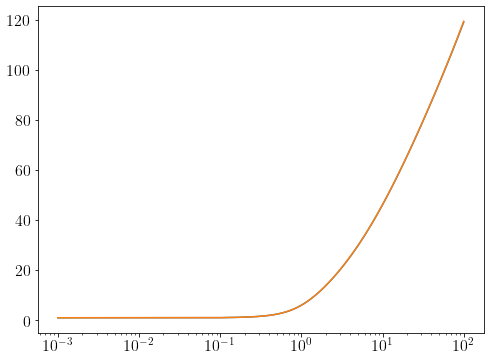

In [53]:
plt.semilogx(ks_ee2, output_boost)
plt.semilogx(ks_ee2, test_boost[0])

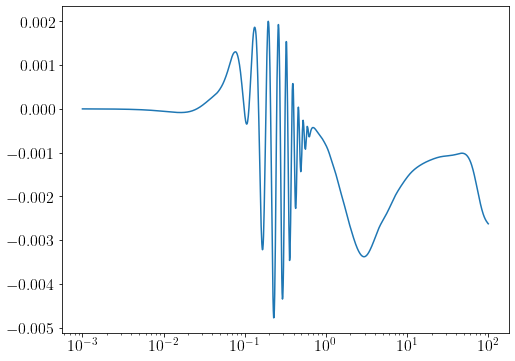

In [55]:
plt.semilogx(ks_ee2, output_boost/test_boost[0] - 1)

## Testing 100 boosts

In [2]:
import halofitemulator

2023-01-31 07:53:30.863394: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusolver.so.11'; dlerror: libcusolver.so.11: cannot open shared object file: No such file or directory
2023-01-31 07:53:30.863978: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1850] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2023-01-31 07:53:30.864317: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
num_test_points = 100
xlims = np.array([emu.lims[par] for par in emu.params])
sampler = LHS(xlimits=xlims)
test_samples = sampler(num_test_points)

In [4]:
emu.params

['h', 'Omegab', 'Omegam', 'As10to9', 'ns']

In [11]:
test_boosts_halofit = np.zeros((100, 49, 1200))
test_boosts_nn      = np.zeros((100, 49, 1200))

for i, sample in enumerate(test_samples):
    cosmo_params = {
        'As':sample[3]*1e-9,
        'ns':sample[4],
        'Omm':sample[2],
        'Omb':sample[1],
        'h':sample[0]        
    }
    ks, pk_lin, pk_nonlin = emu.get_pk(h=sample[0], Omegab=sample[1], Omegam=sample[2], As10to9=sample[3], ns=sample[4], w=-1, redshifts=emu.redshifts)
    test_boosts_halofit[i] = pk_nonlin/pk_lin
    _, test_boosts_nn[i] = halofitemulator.get_boost(cosmo_params)

Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest first)
Note: redshifts have been re-sorted (earliest 

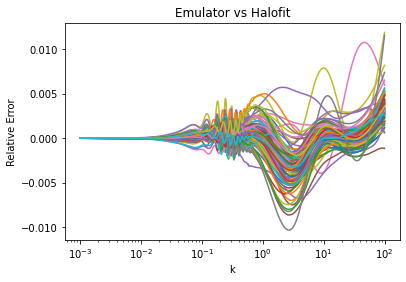

In [19]:
z = 30
for test_boost_nn, test_boost_halofit in zip(test_boosts_nn, test_boosts_halofit):
    plt.semilogx(ks, test_boost_nn[z,:]/test_boost_halofit[z,:] - 1)
    plt.title('Emulator vs Halofit')
    plt.xlabel('k')
    plt.ylabel('Relative Error')